# Introduction

We are going to make a data study of sales of the company ------- to find where we could improve the sale rate and the amount of ganancies.
The main objectives are:

- To segment the data to find patterns.

- Analyze the segmentation to understand the market situation.

- Create predictive models for new customers.

# Libraries

In [149]:
import datetime
import openpyxl
import pickle

import numpy as np
import pandas as pd
import seaborn as sns

import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import DecisionTreeClassifier

from sklearn.model_selection import train_test_split

from sklearn.metrics import jaccard_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

# Dataset load

We start loarding data given by ------.

In this cell below we use openpyxl to load the whole excel document, after we will read the tables one by one to combine it to our dataset and get the whole info.

In [150]:
excel_document = openpyxl.load_workbook('Data/raw data - hack a boss final - Completo.xlsx')

In this cell below we read MAIN DATA table and we set it into a variable to be able to operate with the data.

In [151]:
sheet= excel_document['data_hackaboss (MAIN DATA)']

columnnamelist= ['ID', 'Ship to Customer', 'MATERIAL', 'Window', 'Other_Data',
            'Month', 'Sales_Qty_2024', 'Sales_Qty_2023', 'Sales_Qty_2022',
            'Sales_Qty_2021', 'Net_Sales_2024', 'Net_Sales_2023', 'Net_Sales_2022',
         	'Net_Sales_2021', 'P2_2024', 'P2_2023', 'P2_2022', 'P2_2021']

datos = []
for fila in sheet.iter_rows(min_row=2, values_only=True):
    datos.append(fila)

df= pd.DataFrame(datos, columns= columnnamelist)
df

,ID,Ship to Customer,MATERIAL,Window,Other_Data,Month,Sales_Qty_2024,Sales_Qty_2023,Sales_Qty_2022,Sales_Qty_2021,Net_Sales_2024,Net_Sales_2023,Net_Sales_2022,Net_Sales_2021,P2_2024,P2_2023,P2_2022,P2_2021
0,1,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,0.000000e+00,1.252605e+07,4.830754e+07,0.000000e+00,0.000000e+00,4.344671e+06,8.271403e+06
1,2,ShipToCustomer_952,MAT000093,Null,Data78,3,0,0,0,552187,0.000000e+00,0.000000e+00,0.000000e+00,1.875685e+07,0.000000e+00,0.000000e+00,0.000000e+00,1.588563e+07
2,3,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,2.298762e+06,3.206225e+07,0.000000e+00,2.368493e+06,1.116137e+06,2.648669e+07,0.000000e+00
3,4,ShipToCustomer_27,MAT001731,Null,Data57,6,0,510907,1354,202713,0.000000e+00,3.112911e+07,2.743517e+04,1.568297e+07,0.000000e+00,2.490108e+07,6.214330e+03,1.234455e+06
4,5,ShipToCustomer_560,MAT002384,WindowQ4,Data43,6,940998,0,0,0,9.488244e+07,0.000000e+00,0.000000e+00,0.000000e+00,4.321246e+06,0.000000e+00,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99996,ShipToCustomer_910,MAT000913,Null,Data10,1,946018,94172,143659,568311,3.156561e+07,2.899304e+06,1.454027e+07,2.061688e+07,2.650990e+07,1.840796e+06,5.086899e+06,1.616604e+07
99996,99997,ShipToCustomer_482,MAT002394,Null,Data22,11,0,0,328807,587872,0.000000e+00,0.000000e+00,3.029692e+07,3.175142e+07,0.000000e+00,0.000000e+00,2.863717e+07,2.347387e+07
99997,99998,ShipToCustomer_180,MAT002585,Null,Data21,12,805769,33036,748519,0,3.595771e+07,2.874264e+06,4.377299e+07,0.000000e+00,6.920498e+05,2.039037e+06,3.864947e+07,0.000000e+00
99998,99999,ShipToCustomer_65,MAT001194,WindowQ4,Data74,10,361730,950690,135776,0,3.718374e+07,6.163929e+07,2.067007e+06,0.000000e+00,2.974761e+07,2.183700e+07,7.151058e+05,0.000000e+00


Here we drop the 'ID' column because it's the same as index.

In [152]:
df= df.drop('ID', axis=1)

df

,Ship to Customer,MATERIAL,Window,Other_Data,Month,Sales_Qty_2024,Sales_Qty_2023,Sales_Qty_2022,Sales_Qty_2021,Net_Sales_2024,Net_Sales_2023,Net_Sales_2022,Net_Sales_2021,P2_2024,P2_2023,P2_2022,P2_2021
0,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,0.000000e+00,1.252605e+07,4.830754e+07,0.000000e+00,0.000000e+00,4.344671e+06,8.271403e+06
1,ShipToCustomer_952,MAT000093,Null,Data78,3,0,0,0,552187,0.000000e+00,0.000000e+00,0.000000e+00,1.875685e+07,0.000000e+00,0.000000e+00,0.000000e+00,1.588563e+07
2,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,2.298762e+06,3.206225e+07,0.000000e+00,2.368493e+06,1.116137e+06,2.648669e+07,0.000000e+00
3,ShipToCustomer_27,MAT001731,Null,Data57,6,0,510907,1354,202713,0.000000e+00,3.112911e+07,2.743517e+04,1.568297e+07,0.000000e+00,2.490108e+07,6.214330e+03,1.234455e+06
4,ShipToCustomer_560,MAT002384,WindowQ4,Data43,6,940998,0,0,0,9.488244e+07,0.000000e+00,0.000000e+00,0.000000e+00,4.321246e+06,0.000000e+00,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,ShipToCustomer_910,MAT000913,Null,Data10,1,946018,94172,143659,568311,3.156561e+07,2.899304e+06,1.454027e+07,2.061688e+07,2.650990e+07,1.840796e+06,5.086899e+06,1.616604e+07
99996,ShipToCustomer_482,MAT002394,Null,Data22,11,0,0,328807,587872,0.000000e+00,0.000000e+00,3.029692e+07,3.175142e+07,0.000000e+00,0.000000e+00,2.863717e+07,2.347387e+07
99997,ShipToCustomer_180,MAT002585,Null,Data21,12,805769,33036,748519,0,3.595771e+07,2.874264e+06,4.377299e+07,0.000000e+00,6.920498e+05,2.039037e+06,3.864947e+07,0.000000e+00
99998,ShipToCustomer_65,MAT001194,WindowQ4,Data74,10,361730,950690,135776,0,3.718374e+07,6.163929e+07,2.067007e+06,0.000000e+00,2.974761e+07,2.183700e+07,7.151058e+05,0.000000e+00


After studying the excel document it's easy to see that 'Ship to Customer' column is wich connect all of the tables except 'Cust Value's ones, where it's 'SoldTo' column instead so we make some merges to combine the tables and get the final dataset where we will perform our study.

In this cell below we read 'COUNTRY' table and we merge it with our 'MAIN DATA' table, we will make this with every other table in the excel document.

In [153]:
sheet= excel_document['COUNTRY']

datos = []
for fila in sheet.iter_rows(min_row=2, values_only=True):
    datos.append(fila)

df_1= pd.DataFrame(datos, columns= ['SoldTo', 'Country', 'Ship to Customer', 'void1', 'void2', 'void3'])

df_1= df_1.drop(['void1', 'void2', 'void3'], axis=1)

df= df.merge(df_1, on= 'Ship to Customer')

df

,Ship to Customer,MATERIAL,Window,Other_Data,Month,Sales_Qty_2024,Sales_Qty_2023,Sales_Qty_2022,Sales_Qty_2021,Net_Sales_2024,Net_Sales_2023,Net_Sales_2022,Net_Sales_2021,P2_2024,P2_2023,P2_2022,P2_2021,SoldTo,Country
0,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,0.000000e+00,1.252605e+07,4.830754e+07,0.000000e+00,0.000000e+00,4.344671e+06,8.271403e+06,Customer_5922,Country_3
1,ShipToCustomer_952,MAT000093,Null,Data78,3,0,0,0,552187,0.000000e+00,0.000000e+00,0.000000e+00,1.875685e+07,0.000000e+00,0.000000e+00,0.000000e+00,1.588563e+07,Customer_6726,Country_10
2,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,2.298762e+06,3.206225e+07,0.000000e+00,2.368493e+06,1.116137e+06,2.648669e+07,0.000000e+00,Customer_7395,Country_1
3,ShipToCustomer_27,MAT001731,Null,Data57,6,0,510907,1354,202713,0.000000e+00,3.112911e+07,2.743517e+04,1.568297e+07,0.000000e+00,2.490108e+07,6.214330e+03,1.234455e+06,Customer_4533,Country_15
4,ShipToCustomer_560,MAT002384,WindowQ4,Data43,6,940998,0,0,0,9.488244e+07,0.000000e+00,0.000000e+00,0.000000e+00,4.321246e+06,0.000000e+00,0.000000e+00,0.000000e+00,Customer_114,Country_13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,ShipToCustomer_910,MAT000913,Null,Data10,1,946018,94172,143659,568311,3.156561e+07,2.899304e+06,1.454027e+07,2.061688e+07,2.650990e+07,1.840796e+06,5.086899e+06,1.616604e+07,Customer_818,Country_12
99996,ShipToCustomer_482,MAT002394,Null,Data22,11,0,0,328807,587872,0.000000e+00,0.000000e+00,3.029692e+07,3.175142e+07,0.000000e+00,0.000000e+00,2.863717e+07,2.347387e+07,Customer_1314,Country_2
99997,ShipToCustomer_180,MAT002585,Null,Data21,12,805769,33036,748519,0,3.595771e+07,2.874264e+06,4.377299e+07,0.000000e+00,6.920498e+05,2.039037e+06,3.864947e+07,0.000000e+00,Customer_4708,Country_14
99998,ShipToCustomer_65,MAT001194,WindowQ4,Data74,10,361730,950690,135776,0,3.718374e+07,6.163929e+07,2.067007e+06,0.000000e+00,2.974761e+07,2.183700e+07,7.151058e+05,0.000000e+00,Customer_3295,Country_13


Here we make the same with 'KEY ACCOUNT' table.

In [154]:
sheet= excel_document['KEY ACCOUNT']

datos = []
for fila in sheet.iter_rows(min_row=2, values_only=True):
    datos.append(fila)

df_1= pd.DataFrame(datos, columns= ['SoldTo', 'Ship to Customer', 'Key_Account', 'Key_Account_Grouper', 'void1'])

df_1= df_1.drop(['SoldTo', 'void1'], axis=1)

df= df.merge(df_1, on= 'Ship to Customer')

df

,Ship to Customer,MATERIAL,Window,Other_Data,Month,Sales_Qty_2024,Sales_Qty_2023,Sales_Qty_2022,Sales_Qty_2021,Net_Sales_2024,...,Net_Sales_2022,Net_Sales_2021,P2_2024,P2_2023,P2_2022,P2_2021,SoldTo,Country,Key_Account,Key_Account_Grouper
0,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,1.252605e+07,4.830754e+07,0.000000e+00,0.000000e+00,4.344671e+06,8.271403e+06,Customer_5922,Country_3,Key_Account_184,Region_23
1,ShipToCustomer_952,MAT000093,Null,Data78,3,0,0,0,552187,0.000000e+00,...,0.000000e+00,1.875685e+07,0.000000e+00,0.000000e+00,0.000000e+00,1.588563e+07,Customer_6726,Country_10,Key_Account_313,Region_40
2,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,3.206225e+07,0.000000e+00,2.368493e+06,1.116137e+06,2.648669e+07,0.000000e+00,Customer_7395,Country_1,Key_Account_88,Region_35
3,ShipToCustomer_27,MAT001731,Null,Data57,6,0,510907,1354,202713,0.000000e+00,...,2.743517e+04,1.568297e+07,0.000000e+00,2.490108e+07,6.214330e+03,1.234455e+06,Customer_4533,Country_15,Key_Account_44,Region_40
4,ShipToCustomer_560,MAT002384,WindowQ4,Data43,6,940998,0,0,0,9.488244e+07,...,0.000000e+00,0.000000e+00,4.321246e+06,0.000000e+00,0.000000e+00,0.000000e+00,Customer_114,Country_13,Key_Account_247,Region_16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,ShipToCustomer_910,MAT000913,Null,Data10,1,946018,94172,143659,568311,3.156561e+07,...,1.454027e+07,2.061688e+07,2.650990e+07,1.840796e+06,5.086899e+06,1.616604e+07,Customer_818,Country_12,Key_Account_344,Region_39
99996,ShipToCustomer_482,MAT002394,Null,Data22,11,0,0,328807,587872,0.000000e+00,...,3.029692e+07,3.175142e+07,0.000000e+00,0.000000e+00,2.863717e+07,2.347387e+07,Customer_1314,Country_2,Key_Account_86,Region_5
99997,ShipToCustomer_180,MAT002585,Null,Data21,12,805769,33036,748519,0,3.595771e+07,...,4.377299e+07,0.000000e+00,6.920498e+05,2.039037e+06,3.864947e+07,0.000000e+00,Customer_4708,Country_14,Key_Account_121,Region_32
99998,ShipToCustomer_65,MAT001194,WindowQ4,Data74,10,361730,950690,135776,0,3.718374e+07,...,2.067007e+06,0.000000e+00,2.974761e+07,2.183700e+07,7.151058e+05,0.000000e+00,Customer_3295,Country_13,Key_Account_166,Region_16


Same and so until we get our complete dataset, this will duplicate some cells that we will process later.

In [155]:
sheet= excel_document['CUSTOMER TYPE']

datos = []
for fila in sheet.iter_rows(min_row=2, values_only=True):
    datos.append(fila)

df_1= pd.DataFrame(datos, columns= ['SoldTo', 'Customer_Type', 'Ship to Customer'])

df_1= df_1.drop('SoldTo', axis= 1)

df= df.merge(df_1, on= 'Ship to Customer')

df

,Ship to Customer,MATERIAL,Window,Other_Data,Month,Sales_Qty_2024,Sales_Qty_2023,Sales_Qty_2022,Sales_Qty_2021,Net_Sales_2024,...,Net_Sales_2021,P2_2024,P2_2023,P2_2022,P2_2021,SoldTo,Country,Key_Account,Key_Account_Grouper,Customer_Type
0,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,4.830754e+07,0.000000e+00,0.000000e+00,4.344671e+06,8.271403e+06,Customer_5922,Country_3,Key_Account_184,Region_23,Customer_Type_4
1,ShipToCustomer_952,MAT000093,Null,Data78,3,0,0,0,552187,0.000000e+00,...,1.875685e+07,0.000000e+00,0.000000e+00,0.000000e+00,1.588563e+07,Customer_6726,Country_10,Key_Account_313,Region_40,Customer_Type_3
2,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,0.000000e+00,2.368493e+06,1.116137e+06,2.648669e+07,0.000000e+00,Customer_7395,Country_1,Key_Account_88,Region_35,Customer_Type_2
3,ShipToCustomer_27,MAT001731,Null,Data57,6,0,510907,1354,202713,0.000000e+00,...,1.568297e+07,0.000000e+00,2.490108e+07,6.214330e+03,1.234455e+06,Customer_4533,Country_15,Key_Account_44,Region_40,Customer_Type_3
4,ShipToCustomer_560,MAT002384,WindowQ4,Data43,6,940998,0,0,0,9.488244e+07,...,0.000000e+00,4.321246e+06,0.000000e+00,0.000000e+00,0.000000e+00,Customer_114,Country_13,Key_Account_247,Region_16,Customer_Type_7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,ShipToCustomer_910,MAT000913,Null,Data10,1,946018,94172,143659,568311,3.156561e+07,...,2.061688e+07,2.650990e+07,1.840796e+06,5.086899e+06,1.616604e+07,Customer_818,Country_12,Key_Account_344,Region_39,Customer_Type_9
99996,ShipToCustomer_482,MAT002394,Null,Data22,11,0,0,328807,587872,0.000000e+00,...,3.175142e+07,0.000000e+00,0.000000e+00,2.863717e+07,2.347387e+07,Customer_1314,Country_2,Key_Account_86,Region_5,Customer_Type_5
99997,ShipToCustomer_180,MAT002585,Null,Data21,12,805769,33036,748519,0,3.595771e+07,...,0.000000e+00,6.920498e+05,2.039037e+06,3.864947e+07,0.000000e+00,Customer_4708,Country_14,Key_Account_121,Region_32,Customer_Type_7
99998,ShipToCustomer_65,MAT001194,WindowQ4,Data74,10,361730,950690,135776,0,3.718374e+07,...,0.000000e+00,2.974761e+07,2.183700e+07,7.151058e+05,0.000000e+00,Customer_3295,Country_13,Key_Account_166,Region_16,Customer_Type_1


In [156]:
sheet= excel_document['CUST VALUE (1)']

datos = []
for fila in sheet.iter_rows(min_row=2, values_only=True):
    datos.append(fila)

df_1= pd.DataFrame(datos, columns= ['SoldTo', 'Customer_Value1', 'void1', 'void2', 'void3', 'void4', 'void5'])

df_1= df_1.drop(['void1', 'void2', 'void3', 'void4', 'void5'], axis= 1)

df= df.merge(df_1, on= 'SoldTo')

df

,Ship to Customer,MATERIAL,Window,Other_Data,Month,Sales_Qty_2024,Sales_Qty_2023,Sales_Qty_2022,Sales_Qty_2021,Net_Sales_2024,...,P2_2024,P2_2023,P2_2022,P2_2021,SoldTo,Country,Key_Account,Key_Account_Grouper,Customer_Type,Customer_Value1
0,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,0.000000e+00,0.000000e+00,4.344671e+06,8.271403e+06,Customer_5922,Country_3,Key_Account_184,Region_23,Customer_Type_4,Niche Player
1,ShipToCustomer_952,MAT000093,Null,Data78,3,0,0,0,552187,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,1.588563e+07,Customer_6726,Country_10,Key_Account_313,Region_40,Customer_Type_3,Innovative
2,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,2.368493e+06,1.116137e+06,2.648669e+07,0.000000e+00,Customer_7395,Country_1,Key_Account_88,Region_35,Customer_Type_2,Innovative & Faster Growing than Market
3,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,2.368493e+06,1.116137e+06,2.648669e+07,0.000000e+00,Customer_7395,Country_1,Key_Account_88,Region_35,Customer_Type_2,Market Follower
4,ShipToCustomer_27,MAT001731,Null,Data57,6,0,510907,1354,202713,0.000000e+00,...,0.000000e+00,2.490108e+07,6.214330e+03,1.234455e+06,Customer_4533,Country_15,Key_Account_44,Region_40,Customer_Type_3,Innovative & Faster Growing than Market
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190436,ShipToCustomer_180,MAT002585,Null,Data21,12,805769,33036,748519,0,3.595771e+07,...,6.920498e+05,2.039037e+06,3.864947e+07,0.000000e+00,Customer_4708,Country_14,Key_Account_121,Region_32,Customer_Type_7,Innovative
190437,ShipToCustomer_180,MAT002585,Null,Data21,12,805769,33036,748519,0,3.595771e+07,...,6.920498e+05,2.039037e+06,3.864947e+07,0.000000e+00,Customer_4708,Country_14,Key_Account_121,Region_32,Customer_Type_7,Innovative & Faster Growing than Market
190438,ShipToCustomer_65,MAT001194,WindowQ4,Data74,10,361730,950690,135776,0,3.718374e+07,...,2.974761e+07,2.183700e+07,7.151058e+05,0.000000e+00,Customer_3295,Country_13,Key_Account_166,Region_16,Customer_Type_1,Innovative & Faster Growing than Market
190439,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,8.202743e+06,0.000000e+00,0.000000e+00,0.000000e+00,Customer_2755,Country_1,Key_Account_14,Region_30,Customer_Type_10,Faster Growing than Market


In [157]:
sheet= excel_document['CUST VALUE (2)']

datos = []
for fila in sheet.iter_rows(min_row=2, values_only=True):
    datos.append(fila)

df_1= pd.DataFrame(datos, columns= ['SoldTo', 'Customer_Value2', 'void1', 'void2', 'void3', 'void4', 'void5'])

df_1= df_1.drop(['void1', 'void2', 'void3', 'void4', 'void5'], axis= 1)

df= df.merge(df_1, on= 'SoldTo')

df

,Ship to Customer,MATERIAL,Window,Other_Data,Month,Sales_Qty_2024,Sales_Qty_2023,Sales_Qty_2022,Sales_Qty_2021,Net_Sales_2024,...,P2_2023,P2_2022,P2_2021,SoldTo,Country,Key_Account,Key_Account_Grouper,Customer_Type,Customer_Value1,Customer_Value2
0,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,0.000000e+00,4.344671e+06,8.271403e+06,Customer_5922,Country_3,Key_Account_184,Region_23,Customer_Type_4,Niche Player,Partnership
1,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,0.000000e+00,4.344671e+06,8.271403e+06,Customer_5922,Country_3,Key_Account_184,Region_23,Customer_Type_4,Niche Player,Pure Business
2,ShipToCustomer_952,MAT000093,Null,Data78,3,0,0,0,552187,0.000000e+00,...,0.000000e+00,0.000000e+00,1.588563e+07,Customer_6726,Country_10,Key_Account_313,Region_40,Customer_Type_3,Innovative,Advanced Business Ties
3,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,1.116137e+06,2.648669e+07,0.000000e+00,Customer_7395,Country_1,Key_Account_88,Region_35,Customer_Type_2,Innovative & Faster Growing than Market,Partnership
4,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,1.116137e+06,2.648669e+07,0.000000e+00,Customer_7395,Country_1,Key_Account_88,Region_35,Customer_Type_2,Innovative & Faster Growing than Market,Pure Business
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
407441,ShipToCustomer_65,MAT001194,WindowQ4,Data74,10,361730,950690,135776,0,3.718374e+07,...,2.183700e+07,7.151058e+05,0.000000e+00,Customer_3295,Country_13,Key_Account_166,Region_16,Customer_Type_1,Innovative & Faster Growing than Market,Partnership
407442,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,0.000000e+00,0.000000e+00,0.000000e+00,Customer_2755,Country_1,Key_Account_14,Region_30,Customer_Type_10,Faster Growing than Market,Pure Business
407443,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,0.000000e+00,0.000000e+00,0.000000e+00,Customer_2755,Country_1,Key_Account_14,Region_30,Customer_Type_10,Faster Growing than Market,Transactional
407444,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,0.000000e+00,0.000000e+00,0.000000e+00,Customer_2755,Country_1,Key_Account_14,Region_30,Customer_Type_10,Niche Player,Pure Business


In [158]:
sheet= excel_document['BRAND']

datos = []
for fila in sheet.iter_rows(min_row=2, values_only=True):
    datos.append(fila)

df_1= pd.DataFrame(datos, columns= ['MATERIAL', 'BRAND', 'SUB_BRAND'])

df= df.merge(df_1, on= 'MATERIAL')

df

,Ship to Customer,MATERIAL,Window,Other_Data,Month,Sales_Qty_2024,Sales_Qty_2023,Sales_Qty_2022,Sales_Qty_2021,Net_Sales_2024,...,P2_2021,SoldTo,Country,Key_Account,Key_Account_Grouper,Customer_Type,Customer_Value1,Customer_Value2,BRAND,SUB_BRAND
0,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,8.271403e+06,Customer_5922,Country_3,Key_Account_184,Region_23,Customer_Type_4,Niche Player,Partnership,Brand_353,Sub_Brand_18
1,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,8.271403e+06,Customer_5922,Country_3,Key_Account_184,Region_23,Customer_Type_4,Niche Player,Pure Business,Brand_353,Sub_Brand_18
2,ShipToCustomer_952,MAT000093,Null,Data78,3,0,0,0,552187,0.000000e+00,...,1.588563e+07,Customer_6726,Country_10,Key_Account_313,Region_40,Customer_Type_3,Innovative,Advanced Business Ties,Brand_6858,Sub_Brand_84
3,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,0.000000e+00,Customer_7395,Country_1,Key_Account_88,Region_35,Customer_Type_2,Innovative & Faster Growing than Market,Partnership,Brand_7682,Sub_Brand_91
4,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,0.000000e+00,Customer_7395,Country_1,Key_Account_88,Region_35,Customer_Type_2,Innovative & Faster Growing than Market,Pure Business,Brand_7682,Sub_Brand_91
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
407441,ShipToCustomer_65,MAT001194,WindowQ4,Data74,10,361730,950690,135776,0,3.718374e+07,...,0.000000e+00,Customer_3295,Country_13,Key_Account_166,Region_16,Customer_Type_1,Innovative & Faster Growing than Market,Partnership,Brand_959,Sub_Brand_106
407442,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,0.000000e+00,Customer_2755,Country_1,Key_Account_14,Region_30,Customer_Type_10,Faster Growing than Market,Pure Business,Brand_1072,Sub_Brand_118
407443,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,0.000000e+00,Customer_2755,Country_1,Key_Account_14,Region_30,Customer_Type_10,Faster Growing than Market,Transactional,Brand_1072,Sub_Brand_118
407444,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,0.000000e+00,Customer_2755,Country_1,Key_Account_14,Region_30,Customer_Type_10,Niche Player,Pure Business,Brand_1072,Sub_Brand_118


In [159]:
sheet= excel_document['PLANT-SOURCING']

datos = []
for fila in sheet.iter_rows(min_row=2, values_only=True):
    datos.append(fila)

df_1= pd.DataFrame(datos, columns= ['MATERIAL', 'Sourcing_Plant', 'Sourcing_Vendor'])

df= df.merge(df_1, on= 'MATERIAL')

df

,Ship to Customer,MATERIAL,Window,Other_Data,Month,Sales_Qty_2024,Sales_Qty_2023,Sales_Qty_2022,Sales_Qty_2021,Net_Sales_2024,...,Country,Key_Account,Key_Account_Grouper,Customer_Type,Customer_Value1,Customer_Value2,BRAND,SUB_BRAND,Sourcing_Plant,Sourcing_Vendor
0,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,Country_3,Key_Account_184,Region_23,Customer_Type_4,Niche Player,Partnership,Brand_353,Sub_Brand_18,Plant_421,Vendor_993
1,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,Country_3,Key_Account_184,Region_23,Customer_Type_4,Niche Player,Pure Business,Brand_353,Sub_Brand_18,Plant_421,Vendor_993
2,ShipToCustomer_952,MAT000093,Null,Data78,3,0,0,0,552187,0.000000e+00,...,Country_10,Key_Account_313,Region_40,Customer_Type_3,Innovative,Advanced Business Ties,Brand_6858,Sub_Brand_84,Plant_38,Vendor_309
3,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,Country_1,Key_Account_88,Region_35,Customer_Type_2,Innovative & Faster Growing than Market,Partnership,Brand_7682,Sub_Brand_91,Plant_496,Vendor_833
4,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,Country_1,Key_Account_88,Region_35,Customer_Type_2,Innovative & Faster Growing than Market,Pure Business,Brand_7682,Sub_Brand_91,Plant_496,Vendor_833
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
407441,ShipToCustomer_65,MAT001194,WindowQ4,Data74,10,361730,950690,135776,0,3.718374e+07,...,Country_13,Key_Account_166,Region_16,Customer_Type_1,Innovative & Faster Growing than Market,Partnership,Brand_959,Sub_Brand_106,Plant_498,Vendor_907
407442,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Country_1,Key_Account_14,Region_30,Customer_Type_10,Faster Growing than Market,Pure Business,Brand_1072,Sub_Brand_118,Plant_776,Vendor_165
407443,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Country_1,Key_Account_14,Region_30,Customer_Type_10,Faster Growing than Market,Transactional,Brand_1072,Sub_Brand_118,Plant_776,Vendor_165
407444,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Country_1,Key_Account_14,Region_30,Customer_Type_10,Niche Player,Pure Business,Brand_1072,Sub_Brand_118,Plant_776,Vendor_165


In [160]:
sheet= excel_document['TYPE']

datos = []
for fila in sheet.iter_rows(min_row=2, values_only=True):
    datos.append(fila)

df_1= pd.DataFrame(datos, columns= ['MATERIAL', 'Product_Type', 'Product_SubType'])

df= df.merge(df_1, on= 'MATERIAL')

df

,Ship to Customer,MATERIAL,Window,Other_Data,Month,Sales_Qty_2024,Sales_Qty_2023,Sales_Qty_2022,Sales_Qty_2021,Net_Sales_2024,...,Key_Account_Grouper,Customer_Type,Customer_Value1,Customer_Value2,BRAND,SUB_BRAND,Sourcing_Plant,Sourcing_Vendor,Product_Type,Product_SubType
0,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,Region_23,Customer_Type_4,Niche Player,Partnership,Brand_353,Sub_Brand_18,Plant_421,Vendor_993,Product_Type_321,Product_SubType_321-3
1,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,Region_23,Customer_Type_4,Niche Player,Pure Business,Brand_353,Sub_Brand_18,Plant_421,Vendor_993,Product_Type_321,Product_SubType_321-3
2,ShipToCustomer_952,MAT000093,Null,Data78,3,0,0,0,552187,0.000000e+00,...,Region_40,Customer_Type_3,Innovative,Advanced Business Ties,Brand_6858,Sub_Brand_84,Plant_38,Vendor_309,Product_Type_831,Product_SubType_831-4
3,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,Region_35,Customer_Type_2,Innovative & Faster Growing than Market,Partnership,Brand_7682,Sub_Brand_91,Plant_496,Vendor_833,Product_Type_1464,Product_SubType_1464-2
4,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,Region_35,Customer_Type_2,Innovative & Faster Growing than Market,Pure Business,Brand_7682,Sub_Brand_91,Plant_496,Vendor_833,Product_Type_1464,Product_SubType_1464-2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
407441,ShipToCustomer_65,MAT001194,WindowQ4,Data74,10,361730,950690,135776,0,3.718374e+07,...,Region_16,Customer_Type_1,Innovative & Faster Growing than Market,Partnership,Brand_959,Sub_Brand_106,Plant_498,Vendor_907,Product_Type_1179,Product_SubType_1179-2
407442,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Region_30,Customer_Type_10,Faster Growing than Market,Pure Business,Brand_1072,Sub_Brand_118,Plant_776,Vendor_165,Product_Type_922,Product_SubType_922-1
407443,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Region_30,Customer_Type_10,Faster Growing than Market,Transactional,Brand_1072,Sub_Brand_118,Plant_776,Vendor_165,Product_Type_922,Product_SubType_922-1
407444,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Region_30,Customer_Type_10,Niche Player,Pure Business,Brand_1072,Sub_Brand_118,Plant_776,Vendor_165,Product_Type_922,Product_SubType_922-1


In [161]:
sheet= excel_document['MATERIAL TYPE']

datos = []
for fila in sheet.iter_rows(min_row=2, values_only=True):
    datos.append(fila)

df_1= pd.DataFrame(datos, columns= ['MATERIAL', 'Material_Type'])

df= df.merge(df_1, on= 'MATERIAL')

df

,Ship to Customer,MATERIAL,Window,Other_Data,Month,Sales_Qty_2024,Sales_Qty_2023,Sales_Qty_2022,Sales_Qty_2021,Net_Sales_2024,...,Customer_Type,Customer_Value1,Customer_Value2,BRAND,SUB_BRAND,Sourcing_Plant,Sourcing_Vendor,Product_Type,Product_SubType,Material_Type
0,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,Customer_Type_4,Niche Player,Partnership,Brand_353,Sub_Brand_18,Plant_421,Vendor_993,Product_Type_321,Product_SubType_321-3,Material_Type_1
1,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,Customer_Type_4,Niche Player,Pure Business,Brand_353,Sub_Brand_18,Plant_421,Vendor_993,Product_Type_321,Product_SubType_321-3,Material_Type_1
2,ShipToCustomer_952,MAT000093,Null,Data78,3,0,0,0,552187,0.000000e+00,...,Customer_Type_3,Innovative,Advanced Business Ties,Brand_6858,Sub_Brand_84,Plant_38,Vendor_309,Product_Type_831,Product_SubType_831-4,Material_Type_1
3,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,Customer_Type_2,Innovative & Faster Growing than Market,Partnership,Brand_7682,Sub_Brand_91,Plant_496,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1
4,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,Customer_Type_2,Innovative & Faster Growing than Market,Pure Business,Brand_7682,Sub_Brand_91,Plant_496,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
407441,ShipToCustomer_65,MAT001194,WindowQ4,Data74,10,361730,950690,135776,0,3.718374e+07,...,Customer_Type_1,Innovative & Faster Growing than Market,Partnership,Brand_959,Sub_Brand_106,Plant_498,Vendor_907,Product_Type_1179,Product_SubType_1179-2,Material_Type_2
407442,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Customer_Type_10,Faster Growing than Market,Pure Business,Brand_1072,Sub_Brand_118,Plant_776,Vendor_165,Product_Type_922,Product_SubType_922-1,Material_Type_1
407443,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Customer_Type_10,Faster Growing than Market,Transactional,Brand_1072,Sub_Brand_118,Plant_776,Vendor_165,Product_Type_922,Product_SubType_922-1,Material_Type_1
407444,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Customer_Type_10,Niche Player,Pure Business,Brand_1072,Sub_Brand_118,Plant_776,Vendor_165,Product_Type_922,Product_SubType_922-1,Material_Type_1


In [162]:
sheet= excel_document['PLANT TYPE']

datos = []
for fila in sheet.iter_rows(min_row=2, values_only=True):
    datos.append(fila)

df_1= pd.DataFrame(datos, columns= ['Sourcing_Plant', 'Plant_Types'])

df= df.merge(df_1, on= 'Sourcing_Plant')

df

,Ship to Customer,MATERIAL,Window,Other_Data,Month,Sales_Qty_2024,Sales_Qty_2023,Sales_Qty_2022,Sales_Qty_2021,Net_Sales_2024,...,Customer_Value1,Customer_Value2,BRAND,SUB_BRAND,Sourcing_Plant,Sourcing_Vendor,Product_Type,Product_SubType,Material_Type,Plant_Types
0,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,Niche Player,Partnership,Brand_353,Sub_Brand_18,Plant_421,Vendor_993,Product_Type_321,Product_SubType_321-3,Material_Type_1,Plant_Type_2
1,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,Niche Player,Pure Business,Brand_353,Sub_Brand_18,Plant_421,Vendor_993,Product_Type_321,Product_SubType_321-3,Material_Type_1,Plant_Type_2
2,ShipToCustomer_952,MAT000093,Null,Data78,3,0,0,0,552187,0.000000e+00,...,Innovative,Advanced Business Ties,Brand_6858,Sub_Brand_84,Plant_38,Vendor_309,Product_Type_831,Product_SubType_831-4,Material_Type_1,Plant_Type_3
3,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,Innovative & Faster Growing than Market,Partnership,Brand_7682,Sub_Brand_91,Plant_496,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3
4,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,Innovative & Faster Growing than Market,Pure Business,Brand_7682,Sub_Brand_91,Plant_496,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
407441,ShipToCustomer_65,MAT001194,WindowQ4,Data74,10,361730,950690,135776,0,3.718374e+07,...,Innovative & Faster Growing than Market,Partnership,Brand_959,Sub_Brand_106,Plant_498,Vendor_907,Product_Type_1179,Product_SubType_1179-2,Material_Type_2,Plant_Type_1
407442,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Faster Growing than Market,Pure Business,Brand_1072,Sub_Brand_118,Plant_776,Vendor_165,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1
407443,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Faster Growing than Market,Transactional,Brand_1072,Sub_Brand_118,Plant_776,Vendor_165,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1
407444,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Niche Player,Pure Business,Brand_1072,Sub_Brand_118,Plant_776,Vendor_165,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1


Ok, now we got our dataset we will go to the next process.

# Cleaning & Feature Engineering

In this section we will get the dataset able to work with it and more representative to what we are looking for, that is to know wich categories of each column produces more ganancies. We will make it by studying the data and watching it inner relationships beetween customers, sales, brands, materials sold, etc.

This is our preprocessed dataset.

In [163]:
df

,Ship to Customer,MATERIAL,Window,Other_Data,Month,Sales_Qty_2024,Sales_Qty_2023,Sales_Qty_2022,Sales_Qty_2021,Net_Sales_2024,...,Customer_Value1,Customer_Value2,BRAND,SUB_BRAND,Sourcing_Plant,Sourcing_Vendor,Product_Type,Product_SubType,Material_Type,Plant_Types
0,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,Niche Player,Partnership,Brand_353,Sub_Brand_18,Plant_421,Vendor_993,Product_Type_321,Product_SubType_321-3,Material_Type_1,Plant_Type_2
1,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,Niche Player,Pure Business,Brand_353,Sub_Brand_18,Plant_421,Vendor_993,Product_Type_321,Product_SubType_321-3,Material_Type_1,Plant_Type_2
2,ShipToCustomer_952,MAT000093,Null,Data78,3,0,0,0,552187,0.000000e+00,...,Innovative,Advanced Business Ties,Brand_6858,Sub_Brand_84,Plant_38,Vendor_309,Product_Type_831,Product_SubType_831-4,Material_Type_1,Plant_Type_3
3,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,Innovative & Faster Growing than Market,Partnership,Brand_7682,Sub_Brand_91,Plant_496,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3
4,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,Innovative & Faster Growing than Market,Pure Business,Brand_7682,Sub_Brand_91,Plant_496,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
407441,ShipToCustomer_65,MAT001194,WindowQ4,Data74,10,361730,950690,135776,0,3.718374e+07,...,Innovative & Faster Growing than Market,Partnership,Brand_959,Sub_Brand_106,Plant_498,Vendor_907,Product_Type_1179,Product_SubType_1179-2,Material_Type_2,Plant_Type_1
407442,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Faster Growing than Market,Pure Business,Brand_1072,Sub_Brand_118,Plant_776,Vendor_165,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1
407443,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Faster Growing than Market,Transactional,Brand_1072,Sub_Brand_118,Plant_776,Vendor_165,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1
407444,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Niche Player,Pure Business,Brand_1072,Sub_Brand_118,Plant_776,Vendor_165,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1


These are our initial columns.

In [164]:
df.columns

Index(['Ship to Customer', 'MATERIAL', 'Window', 'Other_Data', 'Month',
       'Sales_Qty_2024', 'Sales_Qty_2023', 'Sales_Qty_2022', 'Sales_Qty_2021',
       'Net_Sales_2024', 'Net_Sales_2023', 'Net_Sales_2022', 'Net_Sales_2021',
       'P2_2024', 'P2_2023', 'P2_2022', 'P2_2021', 'SoldTo', 'Country',
       'Key_Account', 'Key_Account_Grouper', 'Customer_Type',
       'Customer_Value1', 'Customer_Value2', 'BRAND', 'SUB_BRAND',
       'Sourcing_Plant', 'Sourcing_Vendor', 'Product_Type', 'Product_SubType',
       'Material_Type', 'Plant_Types'],
      dtype='object')

Here we rename 'SoldTo' column into 'Customer', because it's an importante column and need to be representative.

In [165]:
df= df.rename(columns= {'SoldTo': 'Customer'})

Here we combine the amounts of the years to get a column wich give us a valoration about the total amount of these data by each transaction.

In [166]:
df['Total_Sales_Qty']= df['Sales_Qty_2024']+ df['Sales_Qty_2023']+ df['Sales_Qty_2022']+ df['Sales_Qty_2021']
df['Total_Net_Sales']= df['Net_Sales_2024']+ df['Net_Sales_2023']+ df['Net_Sales_2022']+ df['Net_Sales_2021']
df['Total_P2']= df['P2_2024']+ df['P2_2023']+ df['P2_2022']+ df['P2_2021']

df

,Ship to Customer,MATERIAL,Window,Other_Data,Month,Sales_Qty_2024,Sales_Qty_2023,Sales_Qty_2022,Sales_Qty_2021,Net_Sales_2024,...,SUB_BRAND,Sourcing_Plant,Sourcing_Vendor,Product_Type,Product_SubType,Material_Type,Plant_Types,Total_Sales_Qty,Total_Net_Sales,Total_P2
0,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,Sub_Brand_18,Plant_421,Vendor_993,Product_Type_321,Product_SubType_321-3,Material_Type_1,Plant_Type_2,1198923,6.083359e+07,1.261607e+07
1,ShipToCustomer_804,MAT001622,Null,Data39,10,0,0,456545,742378,0.000000e+00,...,Sub_Brand_18,Plant_421,Vendor_993,Product_Type_321,Product_SubType_321-3,Material_Type_1,Plant_Type_2,1198923,6.083359e+07,1.261607e+07
2,ShipToCustomer_952,MAT000093,Null,Data78,3,0,0,0,552187,0.000000e+00,...,Sub_Brand_84,Plant_38,Vendor_309,Product_Type_831,Product_SubType_831-4,Material_Type_1,Plant_Type_3,552187,1.875685e+07,1.588563e+07
3,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,Sub_Brand_91,Plant_496,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07
4,ShipToCustomer_551,MAT002425,Null,Data59,12,432501,123262,339538,0,8.083579e+06,...,Sub_Brand_91,Plant_496,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
407441,ShipToCustomer_65,MAT001194,WindowQ4,Data74,10,361730,950690,135776,0,3.718374e+07,...,Sub_Brand_106,Plant_498,Vendor_907,Product_Type_1179,Product_SubType_1179-2,Material_Type_2,Plant_Type_1,1448196,1.008900e+08,5.229971e+07
407442,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Sub_Brand_118,Plant_776,Vendor_165,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1,933866,2.158648e+07,8.202743e+06
407443,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Sub_Brand_118,Plant_776,Vendor_165,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1,933866,2.158648e+07,8.202743e+06
407444,ShipToCustomer_784,MAT002654,Null,Data74,12,933866,0,0,0,2.158648e+07,...,Sub_Brand_118,Plant_776,Vendor_165,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1,933866,2.158648e+07,8.202743e+06


In this cell we make a melt of 'Net_Sales's columns to get a detailed info about each month of transaction activity.

In [167]:
df= pd.melt(df, id_vars=['Customer', 'MATERIAL', 'Window', 'Other_Data', 'Country', 'Key_Account',
                        'Key_Account_Grouper', 'Customer_Type', 'Customer_Value1', 'Customer_Value2',
                        'BRAND', 'SUB_BRAND', 'Sourcing_Plant', 'Sourcing_Vendor', 'Product_Type', 'Product_SubType',
                        'Material_Type', 'Plant_Types', 'Total_Sales_Qty', 'Total_Net_Sales', 'Total_P2', 'Month'],
                        value_vars= ['Net_Sales_2024', 'Net_Sales_2023', 'Net_Sales_2022', 'Net_Sales_2021'],
                        var_name= 'Year', value_name= 'Sales')

df

,Customer,MATERIAL,Window,Other_Data,Country,Key_Account,Key_Account_Grouper,Customer_Type,Customer_Value1,Customer_Value2,...,Product_Type,Product_SubType,Material_Type,Plant_Types,Total_Sales_Qty,Total_Net_Sales,Total_P2,Month,Year,Sales
0,Customer_5922,MAT001622,Null,Data39,Country_3,Key_Account_184,Region_23,Customer_Type_4,Niche Player,Partnership,...,Product_Type_321,Product_SubType_321-3,Material_Type_1,Plant_Type_2,1198923,6.083359e+07,1.261607e+07,10,Net_Sales_2024,0.000000e+00
1,Customer_5922,MAT001622,Null,Data39,Country_3,Key_Account_184,Region_23,Customer_Type_4,Niche Player,Pure Business,...,Product_Type_321,Product_SubType_321-3,Material_Type_1,Plant_Type_2,1198923,6.083359e+07,1.261607e+07,10,Net_Sales_2024,0.000000e+00
2,Customer_6726,MAT000093,Null,Data78,Country_10,Key_Account_313,Region_40,Customer_Type_3,Innovative,Advanced Business Ties,...,Product_Type_831,Product_SubType_831-4,Material_Type_1,Plant_Type_3,552187,1.875685e+07,1.588563e+07,3,Net_Sales_2024,0.000000e+00
3,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,Innovative & Faster Growing than Market,Partnership,...,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,12,Net_Sales_2024,8.083579e+06
4,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,Innovative & Faster Growing than Market,Pure Business,...,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,12,Net_Sales_2024,8.083579e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1629779,Customer_3295,MAT001194,WindowQ4,Data74,Country_13,Key_Account_166,Region_16,Customer_Type_1,Innovative & Faster Growing than Market,Partnership,...,Product_Type_1179,Product_SubType_1179-2,Material_Type_2,Plant_Type_1,1448196,1.008900e+08,5.229971e+07,10,Net_Sales_2021,0.000000e+00
1629780,Customer_2755,MAT002654,Null,Data74,Country_1,Key_Account_14,Region_30,Customer_Type_10,Faster Growing than Market,Pure Business,...,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1,933866,2.158648e+07,8.202743e+06,12,Net_Sales_2021,0.000000e+00
1629781,Customer_2755,MAT002654,Null,Data74,Country_1,Key_Account_14,Region_30,Customer_Type_10,Faster Growing than Market,Transactional,...,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1,933866,2.158648e+07,8.202743e+06,12,Net_Sales_2021,0.000000e+00
1629782,Customer_2755,MAT002654,Null,Data74,Country_1,Key_Account_14,Region_30,Customer_Type_10,Niche Player,Pure Business,...,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1,933866,2.158648e+07,8.202743e+06,12,Net_Sales_2021,0.000000e+00


Now we will get the date of each month of transaction.

In this cell we get the year of each transaction.

In [168]:
year_dict= {'Net_Sales_2021': 2021,
            'Net_Sales_2022': 2022,
            'Net_Sales_2023': 2023,
            'Net_Sales_2024': 2024}

df['Year']= df['Year'].map(year_dict)

df

,Customer,MATERIAL,Window,Other_Data,Country,Key_Account,Key_Account_Grouper,Customer_Type,Customer_Value1,Customer_Value2,...,Product_Type,Product_SubType,Material_Type,Plant_Types,Total_Sales_Qty,Total_Net_Sales,Total_P2,Month,Year,Sales
0,Customer_5922,MAT001622,Null,Data39,Country_3,Key_Account_184,Region_23,Customer_Type_4,Niche Player,Partnership,...,Product_Type_321,Product_SubType_321-3,Material_Type_1,Plant_Type_2,1198923,6.083359e+07,1.261607e+07,10,2024,0.000000e+00
1,Customer_5922,MAT001622,Null,Data39,Country_3,Key_Account_184,Region_23,Customer_Type_4,Niche Player,Pure Business,...,Product_Type_321,Product_SubType_321-3,Material_Type_1,Plant_Type_2,1198923,6.083359e+07,1.261607e+07,10,2024,0.000000e+00
2,Customer_6726,MAT000093,Null,Data78,Country_10,Key_Account_313,Region_40,Customer_Type_3,Innovative,Advanced Business Ties,...,Product_Type_831,Product_SubType_831-4,Material_Type_1,Plant_Type_3,552187,1.875685e+07,1.588563e+07,3,2024,0.000000e+00
3,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,Innovative & Faster Growing than Market,Partnership,...,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,12,2024,8.083579e+06
4,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,Innovative & Faster Growing than Market,Pure Business,...,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,12,2024,8.083579e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1629779,Customer_3295,MAT001194,WindowQ4,Data74,Country_13,Key_Account_166,Region_16,Customer_Type_1,Innovative & Faster Growing than Market,Partnership,...,Product_Type_1179,Product_SubType_1179-2,Material_Type_2,Plant_Type_1,1448196,1.008900e+08,5.229971e+07,10,2021,0.000000e+00
1629780,Customer_2755,MAT002654,Null,Data74,Country_1,Key_Account_14,Region_30,Customer_Type_10,Faster Growing than Market,Pure Business,...,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1,933866,2.158648e+07,8.202743e+06,12,2021,0.000000e+00
1629781,Customer_2755,MAT002654,Null,Data74,Country_1,Key_Account_14,Region_30,Customer_Type_10,Faster Growing than Market,Transactional,...,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1,933866,2.158648e+07,8.202743e+06,12,2021,0.000000e+00
1629782,Customer_2755,MAT002654,Null,Data74,Country_1,Key_Account_14,Region_30,Customer_Type_10,Niche Player,Pure Business,...,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1,933866,2.158648e+07,8.202743e+06,12,2021,0.000000e+00


Here we change the type of the time columns to string to be able to concatenate them.

In [169]:
df[['Month', 'Year']]= df[['Month', 'Year']].astype('str')

In this cell below we get the timestamp of each transaction to be able to operate with it.

In [170]:
df['Date']= df['Month'] + '/'+  df['Year']

df['Date']= df['Date'].astype('str')

df['Date']= [datetime.datetime.timestamp(datetime.datetime.strptime(date, "%m/%Y")) for date in df['Date']]

df['Date']

0          1.727734e+09
1          1.727734e+09
2          1.709248e+09
3          1.733008e+09
4          1.733008e+09
               ...     
1629779    1.633039e+09
1629780    1.638313e+09
1629781    1.638313e+09
1629782    1.638313e+09
1629783    1.638313e+09
Name: Date, Length: 1629784, dtype: float64

Now we drop the time columns that we used to get the interesting ones.

In [171]:
df= df.drop(['Month', 'Year'], axis= 1)

df

,Customer,MATERIAL,Window,Other_Data,Country,Key_Account,Key_Account_Grouper,Customer_Type,Customer_Value1,Customer_Value2,...,Sourcing_Vendor,Product_Type,Product_SubType,Material_Type,Plant_Types,Total_Sales_Qty,Total_Net_Sales,Total_P2,Sales,Date
0,Customer_5922,MAT001622,Null,Data39,Country_3,Key_Account_184,Region_23,Customer_Type_4,Niche Player,Partnership,...,Vendor_993,Product_Type_321,Product_SubType_321-3,Material_Type_1,Plant_Type_2,1198923,6.083359e+07,1.261607e+07,0.000000e+00,1.727734e+09
1,Customer_5922,MAT001622,Null,Data39,Country_3,Key_Account_184,Region_23,Customer_Type_4,Niche Player,Pure Business,...,Vendor_993,Product_Type_321,Product_SubType_321-3,Material_Type_1,Plant_Type_2,1198923,6.083359e+07,1.261607e+07,0.000000e+00,1.727734e+09
2,Customer_6726,MAT000093,Null,Data78,Country_10,Key_Account_313,Region_40,Customer_Type_3,Innovative,Advanced Business Ties,...,Vendor_309,Product_Type_831,Product_SubType_831-4,Material_Type_1,Plant_Type_3,552187,1.875685e+07,1.588563e+07,0.000000e+00,1.709248e+09
3,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,Innovative & Faster Growing than Market,Partnership,...,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09
4,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,Innovative & Faster Growing than Market,Pure Business,...,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1629779,Customer_3295,MAT001194,WindowQ4,Data74,Country_13,Key_Account_166,Region_16,Customer_Type_1,Innovative & Faster Growing than Market,Partnership,...,Vendor_907,Product_Type_1179,Product_SubType_1179-2,Material_Type_2,Plant_Type_1,1448196,1.008900e+08,5.229971e+07,0.000000e+00,1.633039e+09
1629780,Customer_2755,MAT002654,Null,Data74,Country_1,Key_Account_14,Region_30,Customer_Type_10,Faster Growing than Market,Pure Business,...,Vendor_165,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1,933866,2.158648e+07,8.202743e+06,0.000000e+00,1.638313e+09
1629781,Customer_2755,MAT002654,Null,Data74,Country_1,Key_Account_14,Region_30,Customer_Type_10,Faster Growing than Market,Transactional,...,Vendor_165,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1,933866,2.158648e+07,8.202743e+06,0.000000e+00,1.638313e+09
1629782,Customer_2755,MAT002654,Null,Data74,Country_1,Key_Account_14,Region_30,Customer_Type_10,Niche Player,Pure Business,...,Vendor_165,Product_Type_922,Product_SubType_922-1,Material_Type_1,Plant_Type_1,933866,2.158648e+07,8.202743e+06,0.000000e+00,1.638313e+09


And now we drop the products of the melt that has no sale in that month.

In [172]:
df= df[df['Sales']!= 0]

df= df.reset_index().drop('index', axis= 1)

df

,Customer,MATERIAL,Window,Other_Data,Country,Key_Account,Key_Account_Grouper,Customer_Type,Customer_Value1,Customer_Value2,...,Sourcing_Vendor,Product_Type,Product_SubType,Material_Type,Plant_Types,Total_Sales_Qty,Total_Net_Sales,Total_P2,Sales,Date
0,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,Innovative & Faster Growing than Market,Partnership,...,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09
1,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,Innovative & Faster Growing than Market,Pure Business,...,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09
2,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,Market Follower,Partnership,...,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09
3,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,Market Follower,Pure Business,...,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09
4,Customer_114,MAT002384,WindowQ4,Data43,Country_13,Key_Account_247,Region_16,Customer_Type_7,Market Follower,Pure Business,...,Vendor_578,Product_Type_677,Product_SubType_677-3,Material_Type_2,Plant_Type_1,940998,9.488244e+07,4.321246e+06,9.488244e+07,1.717193e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
931861,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,Innovative,Transactional,...,Vendor_529,Product_Type_1074,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09
931862,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,Innovative & Faster Growing than Market,Partnership,...,Vendor_529,Product_Type_1074,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09
931863,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,Innovative & Faster Growing than Market,Pure Business,...,Vendor_529,Product_Type_1074,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09
931864,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,Innovative & Faster Growing than Market,Transactional,...,Vendor_529,Product_Type_1074,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09


The process of these cells below turn categories that we will predict in the future into numerical ponderated values where each customer receive a unique value for each feature, so we will be able to make a classification model posteriorly. 

In this cell below exactly we turn the categories into numbers(encoding) to make the models able to work with it.

In [173]:
df['Customer_Value1']= df['Customer_Value1'].replace({'Niche Player': 0,
                                                      'Market Follower': 1,
                                                      'Faster Growing than Market': 2,
                                                      'Innovative': 3,
                                                      'Innovative & Faster Growing than Market': 4})

df

C:\Users\jds25\AppData\Local\Temp\ipykernel_17100\3424444730.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['Customer_Value1']= df['Customer_Value1'].replace({'Niche Player': 0,


,Customer,MATERIAL,Window,Other_Data,Country,Key_Account,Key_Account_Grouper,Customer_Type,Customer_Value1,Customer_Value2,...,Sourcing_Vendor,Product_Type,Product_SubType,Material_Type,Plant_Types,Total_Sales_Qty,Total_Net_Sales,Total_P2,Sales,Date
0,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,4,Partnership,...,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09
1,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,4,Pure Business,...,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09
2,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,1,Partnership,...,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09
3,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,1,Pure Business,...,Vendor_833,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09
4,Customer_114,MAT002384,WindowQ4,Data43,Country_13,Key_Account_247,Region_16,Customer_Type_7,1,Pure Business,...,Vendor_578,Product_Type_677,Product_SubType_677-3,Material_Type_2,Plant_Type_1,940998,9.488244e+07,4.321246e+06,9.488244e+07,1.717193e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
931861,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,3,Transactional,...,Vendor_529,Product_Type_1074,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09
931862,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,4,Partnership,...,Vendor_529,Product_Type_1074,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09
931863,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,4,Pure Business,...,Vendor_529,Product_Type_1074,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09
931864,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,4,Transactional,...,Vendor_529,Product_Type_1074,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09


In this cell below exactly we save the customers that has each 'Customer_Value1' into a list to know wich Customers has each 'Customer_Value1' to operate it.

In [174]:
cv10= df[df['Customer_Value1']== 0]['Customer'].tolist()
cv11= df[df['Customer_Value1']== 1]['Customer'].tolist()
cv12= df[df['Customer_Value1']== 2]['Customer'].tolist()
cv13= df[df['Customer_Value1']== 3]['Customer'].tolist()
cv14= df[df['Customer_Value1']== 4]['Customer'].tolist()

In this one we use a loop and some 'if's to know wich categories has each Customer. Then we make the correspondent column in the dataset by ponderating the values to a single one when one Customer has more thant 1 Value, it allows us to get a unique value for each Customer that is able to be predicted.

In [175]:
cv1_dict= {}

for cust in df['Customer'].unique():

    aux_list= []

    if cust in cv10:

        aux_list.append(0)

    if cust in cv11:

        aux_list.append(1)

    if cust in cv12:

        aux_list.append(2)

    if cust in cv13:

        aux_list.append(3)

    if cust in cv14:

        aux_list.append(4)

    cv1_dict.update({cust: aux_list})

df['Market Position']= df['Customer'].map(cv1_dict)
df['Market Position']= df['Market Position'].apply(lambda x: np.round(np.mean(x)))

df

,Customer,MATERIAL,Window,Other_Data,Country,Key_Account,Key_Account_Grouper,Customer_Type,Customer_Value1,Customer_Value2,...,Product_Type,Product_SubType,Material_Type,Plant_Types,Total_Sales_Qty,Total_Net_Sales,Total_P2,Sales,Date,Market Position
0,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,4,Partnership,...,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09,2.0
1,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,4,Pure Business,...,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09,2.0
2,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,1,Partnership,...,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09,2.0
3,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,1,Pure Business,...,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09,2.0
4,Customer_114,MAT002384,WindowQ4,Data43,Country_13,Key_Account_247,Region_16,Customer_Type_7,1,Pure Business,...,Product_Type_677,Product_SubType_677-3,Material_Type_2,Plant_Type_1,940998,9.488244e+07,4.321246e+06,9.488244e+07,1.717193e+09,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
931861,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,3,Transactional,...,Product_Type_1074,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09,4.0
931862,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,4,Partnership,...,Product_Type_1074,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09,4.0
931863,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,4,Pure Business,...,Product_Type_1074,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09,4.0
931864,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,4,Transactional,...,Product_Type_1074,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09,4.0


We make the same process with the second target column(Relationship).

Here we make the encode.

In [176]:
df['Customer_Value2']= df['Customer_Value2'].replace({'Opportunistic': 0,
                                                      'Transactional': 1,
                                                      'Pure Business': 2,
                                                      'Advanced Business Ties': 3,
                                                      'Partnership': 4})

df

C:\Users\jds25\AppData\Local\Temp\ipykernel_17100\497211787.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['Customer_Value2']= df['Customer_Value2'].replace({'Opportunistic': 0,


,Customer,MATERIAL,Window,Other_Data,Country,Key_Account,Key_Account_Grouper,Customer_Type,Customer_Value1,Customer_Value2,...,Product_Type,Product_SubType,Material_Type,Plant_Types,Total_Sales_Qty,Total_Net_Sales,Total_P2,Sales,Date,Market Position
0,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,4,4,...,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09,2.0
1,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,4,2,...,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09,2.0
2,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,1,4,...,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09,2.0
3,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,1,2,...,Product_Type_1464,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09,2.0
4,Customer_114,MAT002384,WindowQ4,Data43,Country_13,Key_Account_247,Region_16,Customer_Type_7,1,2,...,Product_Type_677,Product_SubType_677-3,Material_Type_2,Plant_Type_1,940998,9.488244e+07,4.321246e+06,9.488244e+07,1.717193e+09,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
931861,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,3,1,...,Product_Type_1074,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09,4.0
931862,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,4,4,...,Product_Type_1074,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09,4.0
931863,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,4,2,...,Product_Type_1074,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09,4.0
931864,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,4,1,...,Product_Type_1074,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09,4.0


Values division by customer.

In [177]:
cv20= df[df['Customer_Value2']== 0]['Customer'].tolist()
cv21= df[df['Customer_Value2']== 1]['Customer'].tolist()
cv22= df[df['Customer_Value2']== 2]['Customer'].tolist()
cv23= df[df['Customer_Value2']== 3]['Customer'].tolist()
cv24= df[df['Customer_Value2']== 4]['Customer'].tolist()

Transformation of second column into a single value.

In [178]:
cv2_dict= {}

for cust in df['Customer'].unique():

    aux_list= []

    if cust in cv20:

        aux_list.append(0)

    if cust in cv21:

        aux_list.append(1)

    if cust in cv22:

        aux_list.append(2)

    if cust in cv23:

        aux_list.append(3)

    if cust in cv24:

        aux_list.append(4)

    cv2_dict.update({cust: aux_list})

df['Relationship']= df['Customer'].map(cv2_dict)
df['Relationship']= df['Relationship'].apply(lambda x: np.round(np.mean(x)))

df

,Customer,MATERIAL,Window,Other_Data,Country,Key_Account,Key_Account_Grouper,Customer_Type,Customer_Value1,Customer_Value2,...,Product_SubType,Material_Type,Plant_Types,Total_Sales_Qty,Total_Net_Sales,Total_P2,Sales,Date,Market Position,Relationship
0,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,4,4,...,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09,2.0,3.0
1,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,4,2,...,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09,2.0,3.0
2,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,1,4,...,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09,2.0,3.0
3,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,1,2,...,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09,2.0,3.0
4,Customer_114,MAT002384,WindowQ4,Data43,Country_13,Key_Account_247,Region_16,Customer_Type_7,1,2,...,Product_SubType_677-3,Material_Type_2,Plant_Type_1,940998,9.488244e+07,4.321246e+06,9.488244e+07,1.717193e+09,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
931861,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,3,1,...,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09,4.0,2.0
931862,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,4,4,...,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09,4.0,2.0
931863,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,4,2,...,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09,4.0,2.0
931864,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,4,1,...,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09,4.0,2.0


These are the resulting columns.

In [179]:
df.columns

Index(['Customer', 'MATERIAL', 'Window', 'Other_Data', 'Country',
       'Key_Account', 'Key_Account_Grouper', 'Customer_Type',
       'Customer_Value1', 'Customer_Value2', 'BRAND', 'SUB_BRAND',
       'Sourcing_Plant', 'Sourcing_Vendor', 'Product_Type', 'Product_SubType',
       'Material_Type', 'Plant_Types', 'Total_Sales_Qty', 'Total_Net_Sales',
       'Total_P2', 'Sales', 'Date', 'Market Position', 'Relationship'],
      dtype='object')

Here we drop the duplicates that appeared while merging and preprocessing columns.

In [180]:
df= df[['Customer', 'MATERIAL', 'Window', 'Other_Data', 'Country',
        'Key_Account', 'Key_Account_Grouper', 'Customer_Type',
        'BRAND', 'SUB_BRAND', 'Sourcing_Plant', 'Sourcing_Vendor',
        'Product_Type', 'Product_SubType', 'Material_Type',
        'Plant_Types', 'Total_Sales_Qty', 'Total_Net_Sales',
        'Total_P2', 'Sales', 'Date', 'Market Position', 'Relationship']].drop_duplicates().reset_index().drop('index', axis= 1)

df

,Customer,MATERIAL,Window,Other_Data,Country,Key_Account,Key_Account_Grouper,Customer_Type,BRAND,SUB_BRAND,...,Product_SubType,Material_Type,Plant_Types,Total_Sales_Qty,Total_Net_Sales,Total_P2,Sales,Date,Market Position,Relationship
0,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,Brand_7682,Sub_Brand_91,...,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09,2.0,3.0
1,Customer_114,MAT002384,WindowQ4,Data43,Country_13,Key_Account_247,Region_16,Customer_Type_7,Brand_6784,Sub_Brand_4,...,Product_SubType_677-3,Material_Type_2,Plant_Type_1,940998,9.488244e+07,4.321246e+06,9.488244e+07,1.717193e+09,1.0,2.0
2,Customer_4107,MAT000020,WindowQ2,Data82,Country_5,Key_Account_65,Region_33,Customer_Type_7,Brand_4362,Sub_Brand_47,...,Product_SubType_512-5,Material_Type_1,Plant_Type_1,62124,3.974515e+06,1.711941e+06,3.974515e+06,1.727734e+09,0.0,0.0
3,Customer_5550,MAT000886,WindowQ2,Data64,Country_5,Key_Account_98,Region_18,Customer_Type_1,Brand_4460,Sub_Brand_26,...,Product_SubType_1172-2,Material_Type_2,Plant_Type_4,1976818,1.655961e+08,7.758284e+07,5.596795e+07,1.711922e+09,0.0,2.0
4,Customer_6785,MAT001156,Null,Data17,Country_1,Key_Account_22,Region_46,Customer_Type_7,Brand_2419,Sub_Brand_110,...,Product_SubType_714-1,Material_Type_2,Plant_Type_1,748480,2.206608e+07,1.415410e+07,2.206608e+07,1.706742e+09,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
228644,Customer_5593,MAT002175,Null,Data12,Country_14,Key_Account_130,Region_22,Customer_Type_8,Brand_6816,Sub_Brand_67,...,Product_SubType_700-3,Material_Type_2,Plant_Type_2,459290,4.630218e+07,4.529227e+07,4.630218e+07,1.622498e+09,4.0,2.0
228645,Customer_5679,MAT002877,WindowQ3,Not Apply,Country_12,Key_Account_54,Region_1,Customer_Type_4,Brand_4155,Sub_Brand_60,...,Product_SubType_201-3,Material_Type_1,Plant_Type_4,221181,2.055820e+07,5.189872e+06,2.055820e+07,1.638313e+09,4.0,0.0
228646,Customer_4178,MAT001244,Null,Data34,Country_14,Key_Account_267,Region_18,Customer_Type_1,Brand_2357,Sub_Brand_95,...,Product_SubType_138-3,Material_Type_1,Plant_Type_1,2253816,1.653002e+08,7.992686e+07,3.200553e+07,1.630447e+09,2.0,1.0
228647,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,Brand_1422,Sub_Brand_101,...,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09,4.0,2.0


---

Now let's take a look to the dataframe column by column to see what could be interesting to apreciate.

In [181]:
df

,Customer,MATERIAL,Window,Other_Data,Country,Key_Account,Key_Account_Grouper,Customer_Type,BRAND,SUB_BRAND,...,Product_SubType,Material_Type,Plant_Types,Total_Sales_Qty,Total_Net_Sales,Total_P2,Sales,Date,Market Position,Relationship
0,Customer_7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,Brand_7682,Sub_Brand_91,...,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09,2.0,3.0
1,Customer_114,MAT002384,WindowQ4,Data43,Country_13,Key_Account_247,Region_16,Customer_Type_7,Brand_6784,Sub_Brand_4,...,Product_SubType_677-3,Material_Type_2,Plant_Type_1,940998,9.488244e+07,4.321246e+06,9.488244e+07,1.717193e+09,1.0,2.0
2,Customer_4107,MAT000020,WindowQ2,Data82,Country_5,Key_Account_65,Region_33,Customer_Type_7,Brand_4362,Sub_Brand_47,...,Product_SubType_512-5,Material_Type_1,Plant_Type_1,62124,3.974515e+06,1.711941e+06,3.974515e+06,1.727734e+09,0.0,0.0
3,Customer_5550,MAT000886,WindowQ2,Data64,Country_5,Key_Account_98,Region_18,Customer_Type_1,Brand_4460,Sub_Brand_26,...,Product_SubType_1172-2,Material_Type_2,Plant_Type_4,1976818,1.655961e+08,7.758284e+07,5.596795e+07,1.711922e+09,0.0,2.0
4,Customer_6785,MAT001156,Null,Data17,Country_1,Key_Account_22,Region_46,Customer_Type_7,Brand_2419,Sub_Brand_110,...,Product_SubType_714-1,Material_Type_2,Plant_Type_1,748480,2.206608e+07,1.415410e+07,2.206608e+07,1.706742e+09,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
228644,Customer_5593,MAT002175,Null,Data12,Country_14,Key_Account_130,Region_22,Customer_Type_8,Brand_6816,Sub_Brand_67,...,Product_SubType_700-3,Material_Type_2,Plant_Type_2,459290,4.630218e+07,4.529227e+07,4.630218e+07,1.622498e+09,4.0,2.0
228645,Customer_5679,MAT002877,WindowQ3,Not Apply,Country_12,Key_Account_54,Region_1,Customer_Type_4,Brand_4155,Sub_Brand_60,...,Product_SubType_201-3,Material_Type_1,Plant_Type_4,221181,2.055820e+07,5.189872e+06,2.055820e+07,1.638313e+09,4.0,0.0
228646,Customer_4178,MAT001244,Null,Data34,Country_14,Key_Account_267,Region_18,Customer_Type_1,Brand_2357,Sub_Brand_95,...,Product_SubType_138-3,Material_Type_1,Plant_Type_1,2253816,1.653002e+08,7.992686e+07,3.200553e+07,1.630447e+09,2.0,1.0
228647,Customer_818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,Brand_1422,Sub_Brand_101,...,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09,4.0,2.0


In [182]:
df.columns

Index(['Customer', 'MATERIAL', 'Window', 'Other_Data', 'Country',
       'Key_Account', 'Key_Account_Grouper', 'Customer_Type', 'BRAND',
       'SUB_BRAND', 'Sourcing_Plant', 'Sourcing_Vendor', 'Product_Type',
       'Product_SubType', 'Material_Type', 'Plant_Types', 'Total_Sales_Qty',
       'Total_Net_Sales', 'Total_P2', 'Sales', 'Date', 'Market Position',
       'Relationship'],
      dtype='object')

***Customer***

Customer column:

In [183]:
df['Customer']

0         Customer_7395
1          Customer_114
2         Customer_4107
3         Customer_5550
4         Customer_6785
              ...      
228644    Customer_5593
228645    Customer_5679
228646    Customer_4178
228647     Customer_818
228648    Customer_1314
Name: Customer, Length: 228649, dtype: object

Here we clean the name to get just the number as ID.

In [184]:
df['Customer']= df['Customer'].str.replace('Customer_', '')

df

,Customer,MATERIAL,Window,Other_Data,Country,Key_Account,Key_Account_Grouper,Customer_Type,BRAND,SUB_BRAND,...,Product_SubType,Material_Type,Plant_Types,Total_Sales_Qty,Total_Net_Sales,Total_P2,Sales,Date,Market Position,Relationship
0,7395,MAT002425,Null,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,Brand_7682,Sub_Brand_91,...,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09,2.0,3.0
1,114,MAT002384,WindowQ4,Data43,Country_13,Key_Account_247,Region_16,Customer_Type_7,Brand_6784,Sub_Brand_4,...,Product_SubType_677-3,Material_Type_2,Plant_Type_1,940998,9.488244e+07,4.321246e+06,9.488244e+07,1.717193e+09,1.0,2.0
2,4107,MAT000020,WindowQ2,Data82,Country_5,Key_Account_65,Region_33,Customer_Type_7,Brand_4362,Sub_Brand_47,...,Product_SubType_512-5,Material_Type_1,Plant_Type_1,62124,3.974515e+06,1.711941e+06,3.974515e+06,1.727734e+09,0.0,0.0
3,5550,MAT000886,WindowQ2,Data64,Country_5,Key_Account_98,Region_18,Customer_Type_1,Brand_4460,Sub_Brand_26,...,Product_SubType_1172-2,Material_Type_2,Plant_Type_4,1976818,1.655961e+08,7.758284e+07,5.596795e+07,1.711922e+09,0.0,2.0
4,6785,MAT001156,Null,Data17,Country_1,Key_Account_22,Region_46,Customer_Type_7,Brand_2419,Sub_Brand_110,...,Product_SubType_714-1,Material_Type_2,Plant_Type_1,748480,2.206608e+07,1.415410e+07,2.206608e+07,1.706742e+09,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
228644,5593,MAT002175,Null,Data12,Country_14,Key_Account_130,Region_22,Customer_Type_8,Brand_6816,Sub_Brand_67,...,Product_SubType_700-3,Material_Type_2,Plant_Type_2,459290,4.630218e+07,4.529227e+07,4.630218e+07,1.622498e+09,4.0,2.0
228645,5679,MAT002877,WindowQ3,Not Apply,Country_12,Key_Account_54,Region_1,Customer_Type_4,Brand_4155,Sub_Brand_60,...,Product_SubType_201-3,Material_Type_1,Plant_Type_4,221181,2.055820e+07,5.189872e+06,2.055820e+07,1.638313e+09,4.0,0.0
228646,4178,MAT001244,Null,Data34,Country_14,Key_Account_267,Region_18,Customer_Type_1,Brand_2357,Sub_Brand_95,...,Product_SubType_138-3,Material_Type_1,Plant_Type_1,2253816,1.653002e+08,7.992686e+07,3.200553e+07,1.630447e+09,2.0,1.0
228647,818,MAT000913,Null,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,Brand_1422,Sub_Brand_101,...,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09,4.0,2.0


And here we see the quantity of Customers in the dataset, its so under of the total rows in dataset so it means that a lot of customers makes more than 1 buy.

In [185]:
len(df['Customer'].unique())

926

In the customer column we decide to keep it like an ID of customer, that is the main issue to study.

***MATERIAL***

MATERIAL column:

In [186]:
df['MATERIAL']

0         MAT002425
1         MAT002384
2         MAT000020
3         MAT000886
4         MAT001156
            ...    
228644    MAT002175
228645    MAT002877
228646    MAT001244
228647    MAT000913
228648    MAT002394
Name: MATERIAL, Length: 228649, dtype: object

Using this code we can see if there are duplicates in the aggregate function to make a good treating without losing the identity of the data to be able to know wich category is interesting to invest.

In [187]:
len(df.groupby('MATERIAL')['Sales'].sum().value_counts().unique())

1

We consider that the most useful thing we can do in this column is to associate the total amount of sales of each material as it's value. So we make an encode based on the quantity of total amount of each material sold.

In [188]:
mat_dict= df.groupby('MATERIAL')['Sales'].sum().to_dict()

df['MATERIAL']= df['MATERIAL'].map(mat_dict)

df['MATERIAL']

0         3.228712e+09
1         3.305495e+09
2         5.102616e+09
3         4.463693e+09
4         2.260659e+09
              ...     
228644    2.095220e+09
228645    7.364597e+09
228646    1.780219e+09
228647    4.372535e+09
228648    5.394863e+09
Name: MATERIAL, Length: 228649, dtype: float64

***Window***

Window column:

In [189]:
df['Window']

0             Null
1         WindowQ4
2         WindowQ2
3         WindowQ2
4             Null
            ...   
228644        Null
228645    WindowQ3
228646        Null
228647        Null
228648        Null
Name: Window, Length: 228649, dtype: object

In [190]:
df['Window'].unique()

array(['Null', 'WindowQ4', 'WindowQ2', 'WindowQ1', 'WindowQ3'],
      dtype=object)

This columns means the quantity of updates of the king of sale so it's interesting to keep the ordinality. We will make an encode based on and arbitrary order of the updates.

In [191]:
df['Window']= df['Window'].replace({'Null': 0,
                                    'WindowQ1': 1,
                                    'WindowQ2': 2,
                                    'WindowQ3': 3,
                                    'WindowQ4': 4})

df

C:\Users\jds25\AppData\Local\Temp\ipykernel_17100\1405022250.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['Window']= df['Window'].replace({'Null': 0,


,Customer,MATERIAL,Window,Other_Data,Country,Key_Account,Key_Account_Grouper,Customer_Type,BRAND,SUB_BRAND,...,Product_SubType,Material_Type,Plant_Types,Total_Sales_Qty,Total_Net_Sales,Total_P2,Sales,Date,Market Position,Relationship
0,7395,3.228712e+09,0,Data59,Country_1,Key_Account_88,Region_35,Customer_Type_2,Brand_7682,Sub_Brand_91,...,Product_SubType_1464-2,Material_Type_1,Plant_Type_3,895301,4.244459e+07,2.997132e+07,8.083579e+06,1.733008e+09,2.0,3.0
1,114,3.305495e+09,4,Data43,Country_13,Key_Account_247,Region_16,Customer_Type_7,Brand_6784,Sub_Brand_4,...,Product_SubType_677-3,Material_Type_2,Plant_Type_1,940998,9.488244e+07,4.321246e+06,9.488244e+07,1.717193e+09,1.0,2.0
2,4107,5.102616e+09,2,Data82,Country_5,Key_Account_65,Region_33,Customer_Type_7,Brand_4362,Sub_Brand_47,...,Product_SubType_512-5,Material_Type_1,Plant_Type_1,62124,3.974515e+06,1.711941e+06,3.974515e+06,1.727734e+09,0.0,0.0
3,5550,4.463693e+09,2,Data64,Country_5,Key_Account_98,Region_18,Customer_Type_1,Brand_4460,Sub_Brand_26,...,Product_SubType_1172-2,Material_Type_2,Plant_Type_4,1976818,1.655961e+08,7.758284e+07,5.596795e+07,1.711922e+09,0.0,2.0
4,6785,2.260659e+09,0,Data17,Country_1,Key_Account_22,Region_46,Customer_Type_7,Brand_2419,Sub_Brand_110,...,Product_SubType_714-1,Material_Type_2,Plant_Type_1,748480,2.206608e+07,1.415410e+07,2.206608e+07,1.706742e+09,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
228644,5593,2.095220e+09,0,Data12,Country_14,Key_Account_130,Region_22,Customer_Type_8,Brand_6816,Sub_Brand_67,...,Product_SubType_700-3,Material_Type_2,Plant_Type_2,459290,4.630218e+07,4.529227e+07,4.630218e+07,1.622498e+09,4.0,2.0
228645,5679,7.364597e+09,3,Not Apply,Country_12,Key_Account_54,Region_1,Customer_Type_4,Brand_4155,Sub_Brand_60,...,Product_SubType_201-3,Material_Type_1,Plant_Type_4,221181,2.055820e+07,5.189872e+06,2.055820e+07,1.638313e+09,4.0,0.0
228646,4178,1.780219e+09,0,Data34,Country_14,Key_Account_267,Region_18,Customer_Type_1,Brand_2357,Sub_Brand_95,...,Product_SubType_138-3,Material_Type_1,Plant_Type_1,2253816,1.653002e+08,7.992686e+07,3.200553e+07,1.630447e+09,2.0,1.0
228647,818,4.372535e+09,0,Data10,Country_12,Key_Account_344,Region_39,Customer_Type_9,Brand_1422,Sub_Brand_101,...,Product_SubType_1074-3,Material_Type_1,Plant_Type_2,1752160,6.962206e+07,4.960364e+07,2.061688e+07,1.609456e+09,4.0,2.0


***Other_Data***

Other_Data column:

In [192]:
df['Other_Data']

0            Data59
1            Data43
2            Data82
3            Data64
4            Data17
            ...    
228644       Data12
228645    Not Apply
228646       Data34
228647       Data10
228648       Data22
Name: Other_Data, Length: 228649, dtype: object

Here we check the quantity of differents 'Other_Data' values.

In [193]:
df['Other_Data'].unique().tolist()

['Data59',
 'Data43',
 'Data82',
 'Data64',
 'Data17',
 'Data50',
 'Data38',
 'Not Apply',
 'Data37',
 'Data28',
 'Data14',
 'Data21',
 'Data77',
 'Data46',
 'Data65',
 'Data47',
 'Data6',
 'Data66',
 'Data63',
 'Data58',
 'Data15',
 'Data71',
 'Data33',
 'Data40',
 'Data78',
 'Data32',
 'Data69',
 'Data3',
 'Data25',
 'Data76',
 'Data26',
 'Data39',
 'Data84',
 'Data67',
 'Data61',
 'Data11',
 'Data24',
 'Data5',
 'Data79',
 'Data85',
 'Data55',
 'Data22',
 'Data44',
 'Data4',
 'Data62',
 'Data81',
 'Data87',
 'Data19',
 'Data9',
 'Data70',
 'Data83',
 'Data35',
 'Data73',
 'Data8',
 'Data2',
 'Data20',
 'Data75',
 'Data90',
 'Data27',
 'Data13',
 'Data41',
 'Data23',
 'Data42',
 'Data60',
 'Data29',
 'Data49',
 'Data80',
 'Data52',
 'Data10',
 'Data53',
 'Data74',
 'Data45',
 'Data12',
 'Data48',
 'Data31',
 'Data34',
 'Data89',
 'Data54',
 'Data68',
 'Data18',
 'Data72',
 'Data1',
 'Data88',
 'Data16',
 'Data57',
 'Data7',
 'Data51',
 'Data36',
 'Data56',
 'Data86',
 'Data30']

Same code as before to check if we are able to change the category into the total amount of sales of each category.

In [194]:
len(df.groupby('Other_Data')['Sales'].sum().value_counts().unique())

1

It's able so we make it again.

In [195]:
od_dict= df.groupby('Other_Data')['Sales'].sum().to_dict()

df['Other_Data']= df['Other_Data'].map(od_dict)

df['Other_Data']

0         7.170396e+10
1         6.961228e+10
2         6.687281e+10
3         7.244868e+10
4         6.753765e+10
              ...     
228644    7.299629e+10
228645    6.971565e+11
228646    6.665551e+10
228647    6.846944e+10
228648    6.289529e+10
Name: Other_Data, Length: 228649, dtype: float64

***Country***

Country column:

In [196]:
df['Country'].unique()

array(['Country_1', 'Country_13', 'Country_5', 'Country_3', 'Country_4',
       'Country_2', 'Country_10', 'Country_15', 'Country_11', 'Country_6',
       'Country_8', 'Country_12', 'Country_7', 'Country_9', 'Country_14'],
      dtype=object)

In this case we decide to make a get dummies because country is a very important column in classifing data, markets are different in different countries.

In [197]:
df= pd.get_dummies(df, columns= ['Country'])

df

,Customer,MATERIAL,Window,Other_Data,Key_Account,Key_Account_Grouper,Customer_Type,BRAND,SUB_BRAND,Sourcing_Plant,...,Country_Country_14,Country_Country_15,Country_Country_2,Country_Country_3,Country_Country_4,Country_Country_5,Country_Country_6,Country_Country_7,Country_Country_8,Country_Country_9
0,7395,3.228712e+09,0,7.170396e+10,Key_Account_88,Region_35,Customer_Type_2,Brand_7682,Sub_Brand_91,Plant_496,...,False,False,False,False,False,False,False,False,False,False
1,114,3.305495e+09,4,6.961228e+10,Key_Account_247,Region_16,Customer_Type_7,Brand_6784,Sub_Brand_4,Plant_280,...,False,False,False,False,False,False,False,False,False,False
2,4107,5.102616e+09,2,6.687281e+10,Key_Account_65,Region_33,Customer_Type_7,Brand_4362,Sub_Brand_47,Plant_605,...,False,False,False,False,False,True,False,False,False,False
3,5550,4.463693e+09,2,7.244868e+10,Key_Account_98,Region_18,Customer_Type_1,Brand_4460,Sub_Brand_26,Plant_53,...,False,False,False,False,False,True,False,False,False,False
4,6785,2.260659e+09,0,6.753765e+10,Key_Account_22,Region_46,Customer_Type_7,Brand_2419,Sub_Brand_110,Plant_52,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
228644,5593,2.095220e+09,0,7.299629e+10,Key_Account_130,Region_22,Customer_Type_8,Brand_6816,Sub_Brand_67,Plant_549,...,True,False,False,False,False,False,False,False,False,False
228645,5679,7.364597e+09,3,6.971565e+11,Key_Account_54,Region_1,Customer_Type_4,Brand_4155,Sub_Brand_60,Plant_34,...,False,False,False,False,False,False,False,False,False,False
228646,4178,1.780219e+09,0,6.665551e+10,Key_Account_267,Region_18,Customer_Type_1,Brand_2357,Sub_Brand_95,Plant_599,...,True,False,False,False,False,False,False,False,False,False
228647,818,4.372535e+09,0,6.846944e+10,Key_Account_344,Region_39,Customer_Type_9,Brand_1422,Sub_Brand_101,Plant_68,...,False,False,False,False,False,False,False,False,False,False


***Key_Account***

Key_Account column:

In [198]:
df['Key_Account']

0          Key_Account_88
1         Key_Account_247
2          Key_Account_65
3          Key_Account_98
4          Key_Account_22
               ...       
228644    Key_Account_130
228645     Key_Account_54
228646    Key_Account_267
228647    Key_Account_344
228648     Key_Account_86
Name: Key_Account, Length: 228649, dtype: object

Same again, we will make it to the most of columns, because sales are the main feature we are interested to study.

In [199]:
len(df.groupby('Key_Account')['Sales'].sum().value_counts().unique())

1

In [200]:
ka_dict= df.groupby('Key_Account')['Sales'].sum().to_dict()

df['Key_Account']= df['Key_Account'].map(ka_dict)

df['Key_Account']

0         2.653310e+10
1         7.568618e+09
2         2.884574e+10
3         2.898395e+10
4         4.051661e+10
              ...     
228644    2.702321e+10
228645    3.352351e+10
228646    3.684768e+10
228647    2.076615e+10
228648    1.430517e+10
Name: Key_Account, Length: 228649, dtype: float64

***Key_Account_Grouper***

Key_Account_Grouper column:

In [201]:
df['Key_Account_Grouper']

0         Region_35
1         Region_16
2         Region_33
3         Region_18
4         Region_46
            ...    
228644    Region_22
228645     Region_1
228646    Region_18
228647    Region_39
228648     Region_5
Name: Key_Account_Grouper, Length: 228649, dtype: object

Same 'sales encoding', we will call it like this to this process from now.

In [202]:
len(df.groupby('Key_Account_Grouper')['Sales'].sum().value_counts().unique())

1

In [203]:
kag_dict= df.groupby('Key_Account_Grouper')['Sales'].sum()

df['Key_Account_Grouper']= df['Key_Account_Grouper'].map(kag_dict)

df['Key_Account_Grouper']

0         5.358075e+10
1         1.800986e+11
2         1.957491e+11
3         1.308882e+11
4         6.017042e+10
              ...     
228644    2.263782e+11
228645    1.712949e+11
228646    1.308882e+11
228647    1.273801e+11
228648    9.526599e+10
Name: Key_Account_Grouper, Length: 228649, dtype: float64

***Customer_Type***

Customer_Type column:

In [204]:
df['Customer_Type']

0         Customer_Type_2
1         Customer_Type_7
2         Customer_Type_7
3         Customer_Type_1
4         Customer_Type_7
               ...       
228644    Customer_Type_8
228645    Customer_Type_4
228646    Customer_Type_1
228647    Customer_Type_9
228648    Customer_Type_5
Name: Customer_Type, Length: 228649, dtype: object

'Sales encoding'.

In [205]:
df['Customer_Type'].unique()

array(['Customer_Type_2', 'Customer_Type_7', 'Customer_Type_1',
       'Customer_Type_10', 'Customer_Type_8', 'Customer_Type_4',
       'Customer_Type_3', 'Customer_Type_9', 'Customer_Type_5',
       'Customer_Type_6'], dtype=object)

In [206]:
len(df.groupby('Customer_Type')['Sales'].sum().value_counts().unique())

1

In [207]:
ct_dict= df.groupby('Customer_Type')['Sales'].sum().to_dict()

df['Customer_Type']= df['Customer_Type'].map(ct_dict)

df['Customer_Type']

0         7.292580e+11
1         6.691937e+11
2         6.691937e+11
3         7.066909e+11
4         6.691937e+11
              ...     
228644    7.386331e+11
228645    7.544451e+11
228646    7.066909e+11
228647    6.518629e+11
228648    5.771391e+11
Name: Customer_Type, Length: 228649, dtype: float64

***BRAND***

BRAND column:

In [208]:
df['BRAND']

0         Brand_7682
1         Brand_6784
2         Brand_4362
3         Brand_4460
4         Brand_2419
             ...    
228644    Brand_6816
228645    Brand_4155
228646    Brand_2357
228647    Brand_1422
228648    Brand_5500
Name: BRAND, Length: 228649, dtype: object

'Sales encoding'.

In [209]:
len(df.groupby('BRAND')['Sales'].sum().value_counts().unique())

1

In [210]:
b_dict= df.groupby('BRAND')['Sales'].sum().to_dict()

df['BRAND']= df['BRAND'].map(b_dict)

df['BRAND']

0         3.228712e+09
1         6.994540e+09
2         6.362825e+09
3         4.602239e+09
4         2.260659e+09
              ...     
228644    2.095220e+09
228645    9.810900e+09
228646    6.347835e+09
228647    4.372535e+09
228648    9.240277e+09
Name: BRAND, Length: 228649, dtype: float64

***SUB_BRAND***

SUB_BRAND column:

In [211]:
df['SUB_BRAND']

0          Sub_Brand_91
1           Sub_Brand_4
2          Sub_Brand_47
3          Sub_Brand_26
4         Sub_Brand_110
              ...      
228644     Sub_Brand_67
228645     Sub_Brand_60
228646     Sub_Brand_95
228647    Sub_Brand_101
228648    Sub_Brand_105
Name: SUB_BRAND, Length: 228649, dtype: object

'Sales encoding'.

In [212]:
len(df.groupby('SUB_BRAND')['Sales'].sum().value_counts().unique())

1

In [213]:
sb_dict= df.groupby('SUB_BRAND')['Sales'].sum().to_dict()

df['SUB_BRAND']= df['SUB_BRAND'].map(sb_dict)

df['SUB_BRAND']

0         4.507620e+10
1         5.777624e+10
2         7.157776e+10
3         1.889053e+10
4         4.646421e+10
              ...     
228644    3.753808e+10
228645    4.779819e+10
228646    4.191376e+10
228647    3.543388e+10
228648    4.065292e+10
Name: SUB_BRAND, Length: 228649, dtype: float64

***Sourcing_Plant***

Sourcing_Plant column:

In [214]:
df['Sourcing_Plant']

0         Plant_496
1         Plant_280
2         Plant_605
3          Plant_53
4          Plant_52
            ...    
228644    Plant_549
228645     Plant_34
228646    Plant_599
228647     Plant_68
228648    Plant_461
Name: Sourcing_Plant, Length: 228649, dtype: object

'Sales enconding' again.

In [215]:
len(df.groupby('Sourcing_Plant')['Sales'].sum().value_counts().unique())

1

In [216]:
sp_dict= df.groupby('Sourcing_Plant')['Sales'].sum().to_dict()

df['Sourcing_Plant']= df['Sourcing_Plant'].map(sp_dict)

df['Sourcing_Plant']

0         1.532022e+10
1         1.648729e+10
2         3.039244e+10
3         1.310767e+10
4         2.563484e+09
              ...     
228644    3.131122e+10
228645    7.648956e+09
228646    2.045257e+10
228647    1.341936e+10
228648    1.488497e+10
Name: Sourcing_Plant, Length: 228649, dtype: float64

***Sourcing_Vendor***

Sourcing_Vendor column:

In [217]:
df['Sourcing_Vendor']

0         Vendor_833
1         Vendor_578
2         Vendor_764
3         Vendor_719
4           Vendor_7
             ...    
228644    Vendor_187
228645    Vendor_869
228646    Vendor_949
228647    Vendor_529
228648    Vendor_963
Name: Sourcing_Vendor, Length: 228649, dtype: object

'Sales encoding'.

In [218]:
len(df.groupby('Sourcing_Vendor')['Sales'].sum().value_counts().unique())

1

In [219]:
sv_dict= df.groupby('Sourcing_Vendor')['Sales'].sum().to_dict()

df['Sourcing_Vendor']= df['Sourcing_Vendor'].map(sv_dict)

df['Sourcing_Vendor']

0         4.562549e+09
1         1.064078e+10
2         5.102616e+09
3         1.434864e+10
4         1.375890e+10
              ...     
228644    2.329998e+09
228645    1.040509e+10
228646    2.637179e+09
228647    1.617594e+10
228648    9.193756e+09
Name: Sourcing_Vendor, Length: 228649, dtype: float64

In [220]:
df.columns

Index(['Customer', 'MATERIAL', 'Window', 'Other_Data', 'Key_Account',
       'Key_Account_Grouper', 'Customer_Type', 'BRAND', 'SUB_BRAND',
       'Sourcing_Plant', 'Sourcing_Vendor', 'Product_Type', 'Product_SubType',
       'Material_Type', 'Plant_Types', 'Total_Sales_Qty', 'Total_Net_Sales',
       'Total_P2', 'Sales', 'Date', 'Market Position', 'Relationship',
       'Country_Country_1', 'Country_Country_10', 'Country_Country_11',
       'Country_Country_12', 'Country_Country_13', 'Country_Country_14',
       'Country_Country_15', 'Country_Country_2', 'Country_Country_3',
       'Country_Country_4', 'Country_Country_5', 'Country_Country_6',
       'Country_Country_7', 'Country_Country_8', 'Country_Country_9'],
      dtype='object')

***Product_Type***

Product_Type column:

In [221]:
df['Product_Type']

0         Product_Type_1464
1          Product_Type_677
2          Product_Type_512
3         Product_Type_1172
4          Product_Type_714
                ...        
228644     Product_Type_700
228645     Product_Type_201
228646     Product_Type_138
228647    Product_Type_1074
228648    Product_Type_1483
Name: Product_Type, Length: 228649, dtype: object

'Sales encoding'.

In [222]:
len(df.groupby('Product_Type')['Sales'].sum().value_counts().unique())

1

In [223]:
pt_dict= df.groupby('Product_Type')['Sales'].sum().to_dict()

df['Product_Type']= df['Product_Type'].map(pt_dict)

df['Product_Type']

0         3.228712e+09
1         1.387169e+10
2         1.208098e+10
3         9.907392e+09
4         2.260659e+09
              ...     
228644    6.703957e+09
228645    9.363584e+09
228646    4.904481e+09
228647    5.503487e+09
228648    5.394863e+09
Name: Product_Type, Length: 228649, dtype: float64

***Product_SubType***

Product_SubType column:

In [224]:
df['Product_SubType']

0         Product_SubType_1464-2
1          Product_SubType_677-3
2          Product_SubType_512-5
3         Product_SubType_1172-2
4          Product_SubType_714-1
                   ...          
228644     Product_SubType_700-3
228645     Product_SubType_201-3
228646     Product_SubType_138-3
228647    Product_SubType_1074-3
228648    Product_SubType_1483-1
Name: Product_SubType, Length: 228649, dtype: object

We can see that there is like 2 data for each row of these column, like a diferent version of the main data of the column so we decide to separate it into 2 different columns.

This code makes what i have just explained, creating the second column.

In [225]:
df['Product Sub Type 2']= [it.split('-')[1] for it in df['Product_SubType']]

df['Product Sub Type 2']

0         2
1         3
2         5
3         2
4         1
         ..
228644    3
228645    3
228646    3
228647    3
228648    1
Name: Product Sub Type 2, Length: 228649, dtype: object

This code cleans the column from wich we got the second one.

In [226]:
df['Product_SubType']= [it.replace('Product_SubType_', '').split('-')[0] for it in df['Product_SubType']]

df['Product_SubType']

0         1464
1          677
2          512
3         1172
4          714
          ... 
228644     700
228645     201
228646     138
228647    1074
228648    1483
Name: Product_SubType, Length: 228649, dtype: object

'Sales encoding' for the first column then.

In [227]:
len(df.groupby('Product_SubType')['Sales'].sum().value_counts().unique())

1

In [228]:
pst_dict= df.groupby('Product_SubType')['Sales'].sum().to_dict()

df['Product_SubType']= df['Product_SubType'].map(pst_dict)

df['Product_SubType']

0         3.228712e+09
1         1.387169e+10
2         1.208098e+10
3         9.907392e+09
4         2.260659e+09
              ...     
228644    6.703957e+09
228645    9.363584e+09
228646    4.904481e+09
228647    5.503487e+09
228648    5.394863e+09
Name: Product_SubType, Length: 228649, dtype: float64

Now let's check the new column we have created.

***Product Sub Type 2***

Product Sub Type 2 column(wich we just created):

In [229]:
df['Product Sub Type 2']

0         2
1         3
2         5
3         2
4         1
         ..
228644    3
228645    3
228646    3
228647    3
228648    1
Name: Product Sub Type 2, Length: 228649, dtype: object

'Sales encoding' too.

In [230]:
len(df.groupby('Product Sub Type 2')['Sales'].sum().value_counts().unique())

1

In [231]:
pst2_dict= df.groupby('Product Sub Type 2')['Sales'].sum().to_dict()

df['Product Sub Type 2']= df['Product Sub Type 2'].map(pst2_dict)

df['Product Sub Type 2']

0         1.796336e+12
1         1.387576e+12
2         5.082867e+11
3         1.796336e+12
4         1.869306e+12
              ...     
228644    1.387576e+12
228645    1.387576e+12
228646    1.387576e+12
228647    1.387576e+12
228648    1.869306e+12
Name: Product Sub Type 2, Length: 228649, dtype: float64

***Material_Type***

Material_Type column:

In [232]:
df['Material_Type']

0         Material_Type_1
1         Material_Type_2
2         Material_Type_1
3         Material_Type_2
4         Material_Type_2
               ...       
228644    Material_Type_2
228645    Material_Type_1
228646    Material_Type_1
228647    Material_Type_1
228648    Material_Type_1
Name: Material_Type, Length: 228649, dtype: object

Let's take a look to the variety of values of Material_Type column.

In [233]:
df['Material_Type'].unique()

array(['Material_Type_1', 'Material_Type_2'], dtype=object)

Seems like we can make a manual encoding.

In [234]:
df.groupby('Material_Type')['Sales'].sum()

Material_Type
Material_Type_1    3.546800e+12
Material_Type_2    3.329002e+12
Name: Sales, dtype: float64

So here we assignate the 1 to the higher amount and 0 to the lower.

In [235]:
mt_dict= {'Material_Type_1': 1,
          'Material_Type_2': 0}

df['Material_Type']= df['Material_Type'].map(mt_dict)

df['Material_Type']

0         1
1         0
2         1
3         0
4         0
         ..
228644    0
228645    1
228646    1
228647    1
228648    1
Name: Material_Type, Length: 228649, dtype: int64

In [236]:
df.columns

Index(['Customer', 'MATERIAL', 'Window', 'Other_Data', 'Key_Account',
       'Key_Account_Grouper', 'Customer_Type', 'BRAND', 'SUB_BRAND',
       'Sourcing_Plant', 'Sourcing_Vendor', 'Product_Type', 'Product_SubType',
       'Material_Type', 'Plant_Types', 'Total_Sales_Qty', 'Total_Net_Sales',
       'Total_P2', 'Sales', 'Date', 'Market Position', 'Relationship',
       'Country_Country_1', 'Country_Country_10', 'Country_Country_11',
       'Country_Country_12', 'Country_Country_13', 'Country_Country_14',
       'Country_Country_15', 'Country_Country_2', 'Country_Country_3',
       'Country_Country_4', 'Country_Country_5', 'Country_Country_6',
       'Country_Country_7', 'Country_Country_8', 'Country_Country_9',
       'Product Sub Type 2'],
      dtype='object')

***Plant_Types***

Plan_Types column:

In [237]:
df['Plant_Types']

0         Plant_Type_3
1         Plant_Type_1
2         Plant_Type_1
3         Plant_Type_4
4         Plant_Type_1
              ...     
228644    Plant_Type_2
228645    Plant_Type_4
228646    Plant_Type_1
228647    Plant_Type_2
228648    Plant_Type_3
Name: Plant_Types, Length: 228649, dtype: object

In [238]:
df['Plant_Types'].unique()

array(['Plant_Type_3', 'Plant_Type_1', 'Plant_Type_4', 'Plant_Type_2'],
      dtype=object)

'Sales encoding'.

In [239]:
len(df.groupby('Plant_Types')['Sales'].sum().value_counts().unique())

1

In [240]:
pts_dict= df.groupby('Plant_Types')['Sales'].sum().to_dict()

df['Plant_Types']= df['Plant_Types'].map(pts_dict)

df['Plant_Types']

0         1.677964e+12
1         1.819856e+12
2         1.819856e+12
3         1.608153e+12
4         1.819856e+12
              ...     
228644    1.769830e+12
228645    1.608153e+12
228646    1.819856e+12
228647    1.769830e+12
228648    1.677964e+12
Name: Plant_Types, Length: 228649, dtype: float64

***Date***

Date column:

In [241]:
df['Date']

0         1.733008e+09
1         1.717193e+09
2         1.727734e+09
3         1.711922e+09
4         1.706742e+09
              ...     
228644    1.622498e+09
228645    1.638313e+09
228646    1.630447e+09
228647    1.609456e+09
228648    1.635721e+09
Name: Date, Length: 228649, dtype: float64

'Sales encoding' too.

In [242]:
len(df.groupby('Date')['Sales'].sum().value_counts().unique())

1

In [243]:
d_dict= df.groupby('Date')['Sales'].sum().to_dict()

df['Date']= df['Date'].map(d_dict)

df['Date']

0         1.416386e+11
1         1.421218e+11
2         1.429391e+11
3         1.420386e+11
4         1.419960e+11
              ...     
228644    1.409411e+11
228645    1.442656e+11
228646    1.428890e+11
228647    1.463177e+11
228648    1.470844e+11
Name: Date, Length: 228649, dtype: float64

And we finished our column by column study, let's continue.

---

Our columns by now are these:

In [244]:
df.columns

Index(['Customer', 'MATERIAL', 'Window', 'Other_Data', 'Key_Account',
       'Key_Account_Grouper', 'Customer_Type', 'BRAND', 'SUB_BRAND',
       'Sourcing_Plant', 'Sourcing_Vendor', 'Product_Type', 'Product_SubType',
       'Material_Type', 'Plant_Types', 'Total_Sales_Qty', 'Total_Net_Sales',
       'Total_P2', 'Sales', 'Date', 'Market Position', 'Relationship',
       'Country_Country_1', 'Country_Country_10', 'Country_Country_11',
       'Country_Country_12', 'Country_Country_13', 'Country_Country_14',
       'Country_Country_15', 'Country_Country_2', 'Country_Country_3',
       'Country_Country_4', 'Country_Country_5', 'Country_Country_6',
       'Country_Country_7', 'Country_Country_8', 'Country_Country_9',
       'Product Sub Type 2'],
      dtype='object')

Now we need to focus in customers to make sense by making the segmentation. So we make a groupby to get only 1 row per customer and save it into a new variable to be able to decode the categories after.

In [245]:
dfc= df.groupby('Customer')[['MATERIAL', 'Window', 'Other_Data', 'Key_Account',
       'Key_Account_Grouper', 'Customer_Type', 'BRAND', 'SUB_BRAND',
       'Sourcing_Plant', 'Sourcing_Vendor', 'Product_Type', 'Product_SubType',
       'Material_Type', 'Plant_Types', 'Total_Sales_Qty', 'Total_Net_Sales',
       'Total_P2', 'Sales', 'Date', 'Market Position', 'Relationship',
       'Country_Country_1', 'Country_Country_10', 'Country_Country_11',
       'Country_Country_12', 'Country_Country_13', 'Country_Country_14',
       'Country_Country_15', 'Country_Country_2', 'Country_Country_3',
       'Country_Country_4', 'Country_Country_5', 'Country_Country_6',
       'Country_Country_7', 'Country_Country_8', 'Country_Country_9',
       'Product Sub Type 2']].mean()

dfc

,MATERIAL,Window,Other_Data,Key_Account,Key_Account_Grouper,Customer_Type,BRAND,SUB_BRAND,Sourcing_Plant,Sourcing_Vendor,...,Country_Country_15,Country_Country_2,Country_Country_3,Country_Country_4,Country_Country_5,Country_Country_6,Country_Country_7,Country_Country_8,Country_Country_9,Product Sub Type 2
Customer,,,,,,,,,,,,,,,,,,,,,
1005,4.290559e+09,1.443548,1.422866e+11,7.025391e+09,1.816520e+11,7.066909e+11,5.772763e+09,5.750507e+10,1.821699e+10,9.509472e+09,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.600310e+12
1011,5.457946e+09,1.157205,1.315375e+11,1.312493e+10,1.018242e+11,7.095039e+11,5.457946e+09,4.430886e+10,1.386966e+10,1.630996e+10,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.141637e+11
1023,4.650199e+09,1.034826,1.251106e+11,1.965381e+10,6.017042e+10,6.518629e+11,5.039529e+09,4.462623e+10,1.069867e+10,6.334610e+09,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.387576e+12
1039,5.734171e+09,1.329609,1.318131e+11,1.798992e+10,1.178452e+11,7.066909e+11,5.734171e+09,4.274018e+10,1.341880e+10,1.770141e+10,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.425070e+12
1048,4.926501e+09,1.248927,1.280966e+11,2.060777e+10,1.273801e+11,7.386331e+11,7.396607e+09,5.329150e+10,7.154140e+09,1.232369e+10,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.784993e+12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
966,5.994337e+09,1.441860,1.321190e+11,4.214212e+10,1.712949e+11,7.292580e+11,6.346968e+09,4.906471e+10,1.287821e+10,8.700252e+09,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.039006e+12
969,4.174372e+09,1.394958,1.743019e+11,5.774621e+10,2.433932e+11,7.292580e+11,5.846830e+09,3.811142e+10,1.788385e+10,6.892999e+09,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.451808e+12
97,4.099493e+09,1.042735,1.414039e+11,2.736626e+10,1.712949e+11,7.544451e+11,4.572512e+09,4.731850e+10,1.800410e+10,1.100044e+10,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.742706e+12


---

# Clustering

In this part of the study we are going to make a clustering to find interesting data groups that could be useful to invest in.

In this cell below exactly we instance the scaler and we transform the dataset into a normalized array that is able to the clustering and still represents the order of our dataset.

In [246]:
scaler= MinMaxScaler()

X= scaler.fit_transform(dfc)

X

array([[0.24468986, 0.76748939, 0.49869988, ..., 0.        , 0.        ,
        0.84058486],
       [0.37057297, 0.48281181, 0.41440566, ..., 0.        , 0.        ,
        0.25616453],
       [0.283471  , 0.36114429, 0.36400656, ..., 0.        , 0.        ,
        0.71451247],
       ...,
       [0.22408662, 0.36900745, 0.49177744, ..., 0.        , 0.        ,
        0.9249729 ],
       [0.55492183, 0.67913773, 0.3568829 , ..., 0.        , 0.        ,
        0.78902913],
       [0.42602888, 0.68488939, 0.62571544, ..., 0.        , 0.        ,
        0.94334431]])

This code shows us the improvement of the clustering while the number of clusters varies.

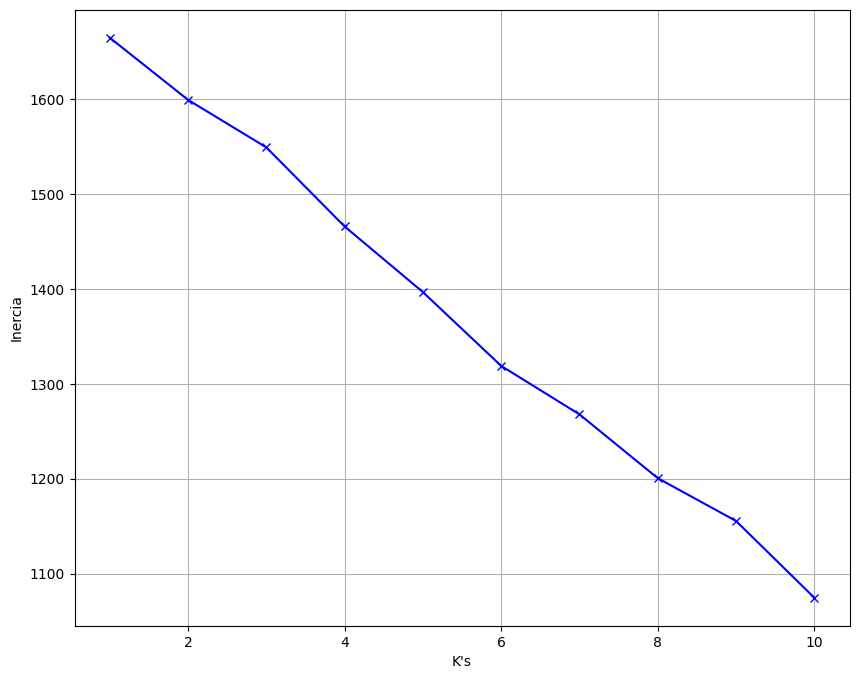

In [247]:
inercias = list() 
  
for k in range(1, 11): 
    
    kmeans = KMeans(n_clusters = k)
    kmeans.fit(X)    
    
    inercias.append(kmeans.inertia_) 

plt.figure(figsize = (10, 8))

plt.plot(range(1, len(inercias) + 1), inercias, marker = "x", color = "blue")

plt.xlabel("K's") 
plt.ylabel("Inercia") 

plt.grid()
plt.show()

We can see that 6 clusters is good enough for us.

So we create our 'Cluster' column.

In [248]:
kmeans = KMeans(n_clusters = 6, random_state=33)
kmeans.fit(X)

dfc['Cluster']= kmeans.labels_

dfc

,MATERIAL,Window,Other_Data,Key_Account,Key_Account_Grouper,Customer_Type,BRAND,SUB_BRAND,Sourcing_Plant,Sourcing_Vendor,...,Country_Country_2,Country_Country_3,Country_Country_4,Country_Country_5,Country_Country_6,Country_Country_7,Country_Country_8,Country_Country_9,Product Sub Type 2,Cluster
Customer,,,,,,,,,,,,,,,,,,,,,
1005,4.290559e+09,1.443548,1.422866e+11,7.025391e+09,1.816520e+11,7.066909e+11,5.772763e+09,5.750507e+10,1.821699e+10,9.509472e+09,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.600310e+12,4
1011,5.457946e+09,1.157205,1.315375e+11,1.312493e+10,1.018242e+11,7.095039e+11,5.457946e+09,4.430886e+10,1.386966e+10,1.630996e+10,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.141637e+11,2
1023,4.650199e+09,1.034826,1.251106e+11,1.965381e+10,6.017042e+10,6.518629e+11,5.039529e+09,4.462623e+10,1.069867e+10,6.334610e+09,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.387576e+12,1
1039,5.734171e+09,1.329609,1.318131e+11,1.798992e+10,1.178452e+11,7.066909e+11,5.734171e+09,4.274018e+10,1.341880e+10,1.770141e+10,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.425070e+12,0
1048,4.926501e+09,1.248927,1.280966e+11,2.060777e+10,1.273801e+11,7.386331e+11,7.396607e+09,5.329150e+10,7.154140e+09,1.232369e+10,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.784993e+12,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
966,5.994337e+09,1.441860,1.321190e+11,4.214212e+10,1.712949e+11,7.292580e+11,6.346968e+09,4.906471e+10,1.287821e+10,8.700252e+09,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.039006e+12,1
969,4.174372e+09,1.394958,1.743019e+11,5.774621e+10,2.433932e+11,7.292580e+11,5.846830e+09,3.811142e+10,1.788385e+10,6.892999e+09,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.451808e+12,1
97,4.099493e+09,1.042735,1.414039e+11,2.736626e+10,1.712949e+11,7.544451e+11,4.572512e+09,4.731850e+10,1.800410e+10,1.100044e+10,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.742706e+12,2


These are the columns of our dataset now.

In [249]:
dfc.columns

Index(['MATERIAL', 'Window', 'Other_Data', 'Key_Account',
       'Key_Account_Grouper', 'Customer_Type', 'BRAND', 'SUB_BRAND',
       'Sourcing_Plant', 'Sourcing_Vendor', 'Product_Type', 'Product_SubType',
       'Material_Type', 'Plant_Types', 'Total_Sales_Qty', 'Total_Net_Sales',
       'Total_P2', 'Sales', 'Date', 'Market Position', 'Relationship',
       'Country_Country_1', 'Country_Country_10', 'Country_Country_11',
       'Country_Country_12', 'Country_Country_13', 'Country_Country_14',
       'Country_Country_15', 'Country_Country_2', 'Country_Country_3',
       'Country_Country_4', 'Country_Country_5', 'Country_Country_6',
       'Country_Country_7', 'Country_Country_8', 'Country_Country_9',
       'Product Sub Type 2', 'Cluster'],
      dtype='object')

At this point we need a cluser classification model, so we will make it in the next cell.

In [250]:
X= dfc.drop('Cluster', axis= 1)
y= dfc['Cluster']

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size= 0.2, random_state= 42)

X_train= scaler.fit_transform(X_train)
X_test= scaler.transform(X_test)

cmodel= RandomForestClassifier()
cmodel.fit(X_train, y_train)

yhat= cmodel.predict(X_test)

print(f'Jaccard: {jaccard_score(y_test, yhat, average= "macro")}')
print(f'Accuracy: {accuracy_score(y_test, yhat)}')
print(f'Precision: {precision_score(y_test, yhat, average= "macro")}')
print(f'Sensibility: {recall_score(y_test, yhat, average= "macro")}')
print(f'f1_score: {f1_score(y_test, yhat, average= "macro")}')

Jaccard: 1.0
Accuracy: 1.0
Precision: 1.0
Sensibility: 1.0
f1_score: 1.0


Our model is good enough predicting the cluster of new data so we keep it.

In [251]:
cmodel

RandomForestClassifier()

---

# Clustering analysis

Now we will analysis the clustering we made:

In this cells below we make ponderations to know the quantity of customers per cluster and the percentage of sells by each cluster.

In [252]:
total_sales= float(dfc['Sales'].sum())

cl0sales= dfc[dfc['Cluster']== 0]['Sales'].sum()
cl1sales= dfc[dfc['Cluster']== 1]['Sales'].sum()
cl2sales= dfc[dfc['Cluster']== 2]['Sales'].sum()
cl3sales= dfc[dfc['Cluster']== 3]['Sales'].sum()
cl4sales= dfc[dfc['Cluster']== 4]['Sales'].sum()
cl5sales= dfc[dfc['Cluster']== 5]['Sales'].sum()

per_cl0_sales= float((cl0sales/total_sales)* 100)
per_cl1_sales= float((cl1sales/total_sales)* 100)
per_cl2_sales= float((cl2sales/total_sales)* 100)
per_cl3_sales= float((cl3sales/total_sales)* 100)
per_cl4_sales= float((cl4sales/total_sales)* 100)
per_cl5_sales= float((cl5sales/total_sales)* 100)

In [253]:
clients_cl0= len(dfc[dfc['Cluster']== 0])
clients_cl1= len(dfc[dfc['Cluster']== 1])
clients_cl2= len(dfc[dfc['Cluster']== 2])
clients_cl3= len(dfc[dfc['Cluster']== 3])
clients_cl4= len(dfc[dfc['Cluster']== 4])
clients_cl5= len(dfc[dfc['Cluster']== 5])

total_clients= len(dfc)

In [254]:
per_clients_cl0= (clients_cl0/total_clients)* 100
per_clients_cl1= (clients_cl1/total_clients)* 100
per_clients_cl2= (clients_cl2/total_clients)* 100
per_clients_cl3= (clients_cl3/total_clients)* 100
per_clients_cl4= (clients_cl4/total_clients)* 100
per_clients_cl5= (clients_cl5/total_clients)* 100

In [255]:
print(f'Cluster 0 has {clients_cl0} customers, {per_cl0_sales}% of total sales.')
print(f'Cluster 1 has {clients_cl1} customers, {per_cl1_sales}% of total sales.')
print(f'Cluster 2 has {clients_cl2} customers, {per_cl2_sales}% of total sales.')
print(f'Cluster 3 has {clients_cl3} customers, {per_cl3_sales}% of total sales.')
print(f'Cluster 4 has {clients_cl4} customers, {per_cl4_sales}% of total sales.')
print(f'Cluster 5 has {clients_cl5} customers, {per_cl5_sales}% of total sales.')

Cluster 0 has 116 customers, 12.483335301953709% of total sales.
Cluster 1 has 301 customers, 32.51717398475582% of total sales.
Cluster 2 has 123 customers, 13.247176456213165% of total sales.
Cluster 3 has 81 customers, 8.687100583758909% of total sales.
Cluster 4 has 229 customers, 24.821937748217472% of total sales.
Cluster 5 has 76 customers, 8.24327592510095% of total sales.


Here we graphic a boxplot to see the density of sales, outliers, max and min of each cluster.

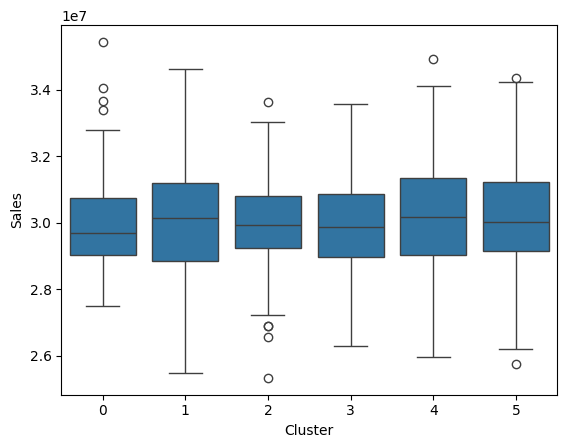

In [256]:
sns.boxplot(dfc,
            x= 'Cluster',
            y= 'Sales')

plt.show()

In this cell we graphic a countplot to confirm the difference in sales of each cluster.

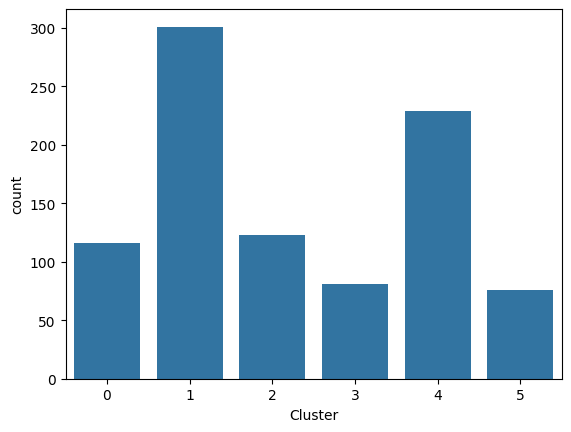

In [257]:
sns.countplot(dfc,
            x= 'Cluster'
            )

plt.show()

In this cell below we can see an histplot that shows us the density and amount of sales.

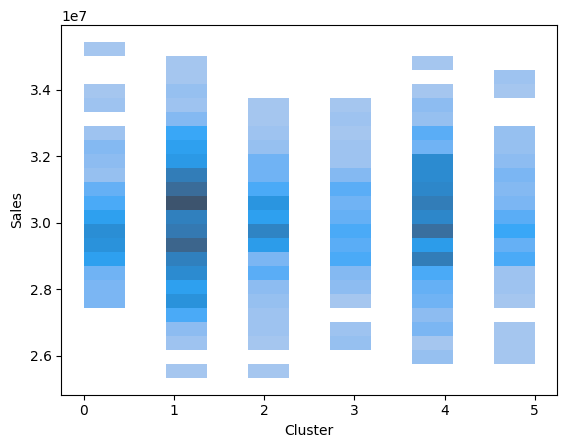

In [258]:
sns.histplot(dfc,
             x= 'Cluster',
             y= 'Sales')

plt.show()

Now we will see wich categories are related to the most interesting clusters(1, 4). Because if we invest on them these sells should araise.

First we filter the dataset in these 2 cells below.

In [259]:
cl1_customers= dfc[dfc['Cluster']== 1].index.tolist()
cl4_customers= dfc[dfc['Cluster']== 4].index.tolist()

In [260]:
df_filtered = df[df['Customer'].isin(cl1_customers) | df['Customer'].isin(cl4_customers)]

df_filtered

,Customer,MATERIAL,Window,Other_Data,Key_Account,Key_Account_Grouper,Customer_Type,BRAND,SUB_BRAND,Sourcing_Plant,...,Country_Country_15,Country_Country_2,Country_Country_3,Country_Country_4,Country_Country_5,Country_Country_6,Country_Country_7,Country_Country_8,Country_Country_9,Product Sub Type 2
5,2202,3.527807e+09,1,6.625162e+10,2.778842e+10,1.817221e+11,7.095039e+11,1.020967e+10,4.880443e+10,1.548973e+10,...,False,False,True,False,False,False,False,False,False,1.387576e+12
6,2602,3.386440e+09,0,6.938267e+10,7.336446e+09,1.522384e+11,7.066909e+11,4.168228e+09,6.529856e+10,1.797436e+10,...,False,False,False,True,False,False,False,False,False,1.869306e+12
12,7716,7.669451e+09,3,7.136019e+10,2.824589e+10,2.263782e+11,7.544451e+11,7.669451e+09,7.491836e+10,1.755141e+10,...,True,False,False,False,False,False,False,False,False,5.082867e+11
13,4906,6.516215e+08,0,6.625162e+10,1.403220e+10,2.554850e+11,6.691937e+11,6.516215e+08,6.144074e+10,1.560696e+09,...,False,False,False,False,False,False,False,False,False,9.620888e+11
14,7542,8.725210e+09,2,7.205493e+10,2.778842e+10,1.817221e+11,7.292580e+11,8.725210e+09,5.196991e+10,8.765778e+09,...,False,False,False,False,False,True,False,False,False,1.387576e+12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
228642,5904,5.487564e+09,4,6.611970e+10,1.414107e+10,1.744173e+11,7.066909e+11,5.487564e+09,5.777624e+10,1.256594e+10,...,False,False,True,False,False,False,False,False,False,9.620888e+11
228644,5593,2.095220e+09,0,7.299629e+10,2.702321e+10,2.263782e+11,7.386331e+11,2.095220e+09,3.753808e+10,3.131122e+10,...,False,False,False,False,False,False,False,False,False,1.387576e+12
228645,5679,7.364597e+09,3,6.971565e+11,3.352351e+10,1.712949e+11,7.544451e+11,9.810900e+09,4.779819e+10,7.648956e+09,...,False,False,False,False,False,False,False,False,False,1.387576e+12
228646,4178,1.780219e+09,0,6.665551e+10,3.684768e+10,1.308882e+11,7.066909e+11,6.347835e+09,4.191376e+10,2.045257e+10,...,False,False,False,False,False,False,False,False,False,1.387576e+12


We will just take in count columns with sense.

In [261]:
df_filtered.columns

Index(['Customer', 'MATERIAL', 'Window', 'Other_Data', 'Key_Account',
       'Key_Account_Grouper', 'Customer_Type', 'BRAND', 'SUB_BRAND',
       'Sourcing_Plant', 'Sourcing_Vendor', 'Product_Type', 'Product_SubType',
       'Material_Type', 'Plant_Types', 'Total_Sales_Qty', 'Total_Net_Sales',
       'Total_P2', 'Sales', 'Date', 'Market Position', 'Relationship',
       'Country_Country_1', 'Country_Country_10', 'Country_Country_11',
       'Country_Country_12', 'Country_Country_13', 'Country_Country_14',
       'Country_Country_15', 'Country_Country_2', 'Country_Country_3',
       'Country_Country_4', 'Country_Country_5', 'Country_Country_6',
       'Country_Country_7', 'Country_Country_8', 'Country_Country_9',
       'Product Sub Type 2'],
      dtype='object')

Now we decode the filtered data in each column. Choosing the biggests sales in each feature.

***Customer***

In this cell we choose the best customers in our filtered dataframe(only clusters 1, 4).

In [262]:
filtered_c_to_invest= df_filtered.groupby('Customer')['Sales'].sum().sort_values(ascending= False).head(50).index.tolist()

filtered_c_to_invest

['2507',
 '4178',
 '244',
 '4010',
 '7417',
 '5922',
 '2',
 '6311',
 '2803',
 '7075',
 '7621',
 '3286',
 '2073',
 '4202',
 '6374',
 '7657',
 '7644',
 '1837',
 '6720',
 '6047',
 '2912',
 '4721',
 '5828',
 '6116',
 '7727',
 '2142',
 '7571',
 '7506',
 '5384',
 '756',
 '7972',
 '78',
 '4789',
 '6679',
 '6404',
 '463',
 '4830',
 '5130',
 '7800',
 '7176',
 '6574',
 '3578',
 '3747',
 '6856',
 '4555',
 '5246',
 '6734',
 '7949',
 '2781',
 '172']

***MATERIAL***

In [263]:
aux_mat_serie= pd.Series(df_filtered['MATERIAL'].unique()).sort_values(ascending= False).head(5)

in_mat_dict= {v: k for k, v in mat_dict.items()}

filtered_mat_to_invest= aux_mat_serie.map(in_mat_dict).tolist()

filtered_mat_to_invest

['MAT001573', 'MAT001077', 'MAT002110', 'MAT002913', 'MAT000999']

***Other_Data***

In [264]:
aux_od_serie= pd.Series(df_filtered['Other_Data'].unique()).sort_values(ascending= False).head(5)

in_od_dict= {v: k for k, v in od_dict.items()}

filtered_od_to_invest= aux_od_serie.map(in_od_dict).tolist()

filtered_od_to_invest

['Not Apply', 'Data18', 'Data60', 'Data12', 'Data15']

***Key_Account***

In [265]:
aux_ka_serie= pd.Series(df_filtered['Key_Account'].unique()).sort_values(ascending= False).head(5)

in_ka_dict= {v: k for k, v in ka_dict.items()}

filtered_ka_to_invest= aux_ka_serie.map(in_ka_dict).tolist()

filtered_ka_to_invest

['Key_Account_40',
 'Key_Account_334',
 'Key_Account_185',
 'Key_Account_385',
 'Key_Account_34']

***Key_Account_Grouper***

In [266]:
aux_kag_serie= pd.Series(df_filtered['Key_Account_Grouper'].unique()).sort_values(ascending= False).head(5)

in_kag_dict= {v: k for k, v in kag_dict.items()}

filtered_kag_to_invest= aux_kag_serie.map(in_kag_dict).tolist()

filtered_kag_to_invest

['Region_32', 'Region_8', 'Region_40', 'Region_22', 'WorldWide']

***Customer_Type***

In [267]:
aux_ct_serie= pd.Series(df_filtered['Customer_Type'].unique()).sort_values(ascending= False).head(5)

in_ct_dict= {v: k for k, v in ct_dict.items()}

filtered_ct_to_invest= aux_ct_serie.map(in_ct_dict).tolist()

filtered_ct_to_invest

['Customer_Type_4',
 'Customer_Type_8',
 'Customer_Type_2',
 'Customer_Type_10',
 'Customer_Type_1']

***BRAND***

In [268]:
aux_b_serie= pd.Series(df_filtered['BRAND'].unique()).sort_values(ascending= False).head(5)

in_b_dict= {v: k for k, v in b_dict.items()}

filtered_b_to_invest= aux_b_serie.map(in_b_dict).tolist()

filtered_b_to_invest

['Brand_4359', 'Brand_4958', 'Brand_5072', 'Brand_2245', 'Brand_1139']

***SUB_BRAND***

In [269]:
aux_sb_serie= pd.Series(df_filtered['SUB_BRAND'].unique()).sort_values(ascending= False).head(5)

in_sb_dict= {v: k for k, v in sb_dict.items()}

filtered_sb_to_invest= aux_sb_serie.map(in_sb_dict).tolist()

filtered_sb_to_invest

['Sub_Brand_43', 'Sub_Brand_82', 'Sub_Brand_56', 'Sub_Brand_2', 'Sub_Brand_18']

***Sourcing_Plant***

In [270]:
aux_sp_serie= pd.Series(df_filtered['Sourcing_Plant'].unique()).sort_values(ascending= False).head(5)

in_sp_dict= {v: k for k, v in sp_dict.items()}

filtered_sp_to_invest= aux_sp_serie.map(in_sp_dict).tolist()

filtered_sp_to_invest

['Plant_332', 'Plant_549', 'Plant_605', 'Plant_579', 'Plant_261']

***Sourcing_Vendor***

In [271]:
aux_sv_serie= pd.Series(df_filtered['Sourcing_Vendor'].unique()).sort_values(ascending= False).head(5)

in_sv_dict= {v: k for k, v in sv_dict.items()}

filtered_sv_to_invest= aux_sv_serie.map(in_sv_dict).tolist()

filtered_sv_to_invest

['Vendor_54', 'Vendor_832', 'Vendor_256', 'Vendor_117', 'Vendor_619']

***Product_Type***

In [272]:
aux_pt_serie= pd.Series(df_filtered['Product_Type'].unique()).sort_values(ascending= False).head(5)

in_pt_dict= {v: k for k, v in pt_dict.items()}

filtered_pt_to_invest= aux_pt_serie.map(in_pt_dict).tolist()

filtered_pt_to_invest

['Product_Type_1485',
 'Product_Type_310',
 'Product_Type_268',
 'Product_Type_541',
 'Product_Type_73']

***Product_SubType***

In [273]:
aux_pst_serie= pd.Series(df_filtered['Product_SubType'].unique()).sort_values(ascending= False).head(5)

in_pst_dict= {v: k for k, v in pst_dict.items()}

filtered_pst_to_invest= aux_pst_serie.map(in_pst_dict).tolist()

filtered_pst_to_invest

['1485', '310', '268', '541', '73']

***Material_Type***

In [274]:
aux_mt_serie= pd.Series(df_filtered['Material_Type'].unique()).sort_values(ascending= False).head(1)

in_mt_dict= {v: k for k, v in mt_dict.items()}

filtered_mt_to_invest= aux_mt_serie.map(in_mt_dict).tolist()

filtered_mt_to_invest

['Material_Type_1']

***Plant_Types***

In [275]:
aux_pts_serie= pd.Series(df_filtered['Plant_Types'].unique()).sort_values(ascending= False).head(2)

in_pts_dict= {v: k for k, v in pts_dict.items()}

filtered_pts_to_invest= aux_pts_serie.map(in_pts_dict).tolist()

filtered_pts_to_invest

['Plant_Type_1', 'Plant_Type_2']

***Product Sub Type 2***

In [276]:
aux_pst2_serie= pd.Series(df_filtered['Product Sub Type 2'].unique()).sort_values(ascending= False).head(5)

in_pst2_dict= {v: k for k, v in pst2_dict.items()}

filtered_pst2_to_invest= aux_pst2_serie.map(in_pst2_dict).tolist()

filtered_pst2_to_invest

['1', '2', '3', '4', '5']

# EDA

The next cell shows us a representation of the whole dataset. It shows the relation of columns in rows of 2 as scatterplots and the relation of column with the same column as a kde plot. As we set the value of each category by the amount of sales of that category it's very representative.

In [277]:
sns.pairplot(dfc,
             palette= 'rainbow',
             hue= 'Cluster',
             corner= True)

plt.show()

***Here we can see several things:*** 

- There is a key account wich sells more than others.
- There is a customer type who sells a lot less than others.
- There are 2 brand bought by the same cluster(1) that sales a bit more than others.
- There is a date when it was sold a bit more than others.
- Only cluster 5 sells in Country_1.
- Only cluster 0 sells in Country_10.
- Only cluster 1 sells in Country_11.
- Only cluster 4 sells in Country_12.
- Only cluster 2 sells in Country_13.
- Only cluster 1 sells in Country_14.
- Only cluster 4 sells in Country_15.
- Only cluster 2 sells in Country_2.
- Only cluster 4 sells in Country_3.
- Only cluster 1 sells in Country_4.
- Only cluster 3 sells in Country_5.
- Only cluster 1 sells in Country_6.
- Only cluster 4 sells in Country_7.
- Only cluster 0 sells in Country_8.
- Only cluster 1 sells in Country_9.

---

# Decoding

Now we will get the categories that are interesting to invest in by decoding them.

Here are the interesting customers.

In [278]:
customers_to_invest= df.groupby('Customer')['Sales'].sum().sort_values(ascending= False).head(50).index.tolist()

customers_to_invest

['2350',
 '2507',
 '4178',
 '934',
 '4467',
 '1385',
 '5597',
 '244',
 '4010',
 '6141',
 '7417',
 '5922',
 '2',
 '6311',
 '2803',
 '466',
 '7075',
 '6975',
 '7621',
 '2089',
 '2951',
 '4035',
 '3286',
 '2807',
 '4233',
 '4325',
 '4132',
 '2073',
 '4202',
 '6747',
 '6374',
 '7657',
 '575',
 '5363',
 '7644',
 '1837',
 '3200',
 '6720',
 '3353',
 '5550',
 '6047',
 '6323',
 '4230',
 '2912',
 '4721',
 '5828',
 '5184',
 '6785',
 '6116',
 '7727']

The key account.

In [279]:
key_account_to_invest= pd.Series(ka_dict).sort_values(ascending= False).head(1).index.tolist()

key_account_to_invest

['Key_Account_40']

Here we can see wich customers type are not interesting to invest in.

In [280]:
customer_type_to_not_invest= pd.Series(ct_dict).sort_values().head(1).index.tolist()

customer_type_to_not_invest

['Customer_Type_5']

In this cell below we see the interesting brands.

In [281]:
brands_to_invest= pd.Series(b_dict).sort_values(ascending= False).head(2).index.tolist()

brands_to_invest

['Brand_4359', 'Brand_4958']

Here we see the date wich had the highest sells in whole dataframe.

In [282]:
date_to_investigate= pd.Series(d_dict).sort_values(ascending= False).head(1).index.tolist()

date_to_investigate= datetime.datetime.fromtimestamp(date_to_investigate[0]).strftime('%m/%Y')

date_to_investigate

'11/2023'

---

# Pairplot data retrieving

Now we take in count the data we discovered in the pairplot.

- Clusters 1 and 4 sells a lot more.
- Clusters 3 and 5 sells a lot less.
- Key account 40 sells a lot more than others.
- Customer type 5 sells a lot less than others.
- Brands 4359 and 4958 sells a bit more than others.
- In November of 2023 there are a peak of sells.
- Only cluster 1 sells in countries 11, 14, 4, 6, 9.
- Only cluster 4 sells in countries 12, 15, 3, 7.
- Only cluster 3 sells in country 5.
- Only cluster 5 sells in country 1.

So we decide the next:

- Customers in clusters 1 and 4 are interesting to invest in.
- Customers in cluster 2, 3 and 5 are not interesting to invest resources.
- There are some customers who are interesting to invest in.
- Key account 40 is interesting to invest in.
- Brands 4395 and 4958 are interesting to invest in.
- We should investigate November of 2023 to know why there was a bit more sells than ever.
- Countries 11, 14, 4, 6, 9, 12, 15, 3 and 7 are interesting to study their markets and improve the sells there.
- Countries 5 and 1 are not interesting to invest in.
- Customer type 5 is not interesting to invest in.

In [283]:
countries_to_invest= ['Country_3', 'Country_4', 'Country_6', 'Country_7', 'Country_9', 'Country_11', 'Country_12', 'Country_14', 'Country_15']

---

# Predictions models

Once we have segmented the dataframe and we undertand it, we can go to the second part of the study that includes to make models to predict the target columns('Market Position' and 'Relationship')

***Market Position***

In this code we make a loop to train our models and get the metrics in a dictionary.

In [284]:
models = [
    ('KNeighborsClassifier', KNeighborsClassifier()),
    ('NearestCentroid', NearestCentroid()),
    ('GaussianNB', GaussianNB()),
    ('LogisticRegression', LogisticRegression()),
    ('DecisionTreeClassifier', DecisionTreeClassifier()),
    ('RandomForestClassifier', RandomForestClassifier()),
    ('AdaBoostClassifier', AdaBoostClassifier()),
    ]

X= df.drop(['Market Position', 'Relationship'], axis= 1)
y= df['Market Position']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train= scaler.fit_transform(X_train)
X_test= scaler.transform(X_test)  
    

cv1metrics_dict= {}

for name, mdl in models:

    model= mdl
    model.fit(X_train, y_train)
    yhat= model.predict(X_test)
    
    jaccard= jaccard_score(y_test, yhat, average = "macro")
    accuracy= accuracy_score(y_test, yhat)
    precision= precision_score(y_test, yhat, average = "macro")
    sensibility= recall_score(y_test, yhat, average = "macro")
    f1score= f1_score(y_test, yhat, average = "macro")

    aux_dict= {'jaccard': jaccard,
                'accuracy': accuracy,
                'precision': precision,
                'sensibility': sensibility,
                'f1_score': f1score,
                'model': model
                }
    
    cv1metrics_dict[name]= aux_dict
    
cv1metrics_dict

c:\Users\jds25\Desktop\Trabajo\Omya\ovenv\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


{'KNeighborsClassifier': {'jaccard': np.float64(0.9515260155381885),
  'accuracy': 0.9784386617100371,
  'precision': np.float64(0.9760995890358517),
  'sensibility': np.float64(0.9741864804217043),
  'f1_score': np.float64(0.97513304147722),
  'model': KNeighborsClassifier()},
 'NearestCentroid': {'jaccard': np.float64(0.1541036513724359),
  'accuracy': 0.2946424666520883,
  'precision': np.float64(0.27364797638193283),
  'sensibility': np.float64(0.3003728868614372),
  'f1_score': np.float64(0.26338019907398935),
  'model': NearestCentroid()},
 'GaussianNB': {'jaccard': np.float64(0.05929382586628703),
  'accuracy': 0.13933960201180845,
  'precision': np.float64(0.28633863830431217),
  'sensibility': np.float64(0.23929989185376602),
  'f1_score': np.float64(0.11035079748980477),
  'model': GaussianNB()},
 'LogisticRegression': {'jaccard': np.float64(0.10142828888441509),
  'accuracy': 0.47448064727749834,
  'precision': np.float64(0.22897469683956947),
  'sensibility': np.float64(0.2

And now we navigate the dictionary making a manual ponderation of the metrics to get the best model.

In [285]:
model1_dict= {}



mscore= 0
fmodel= str()
metrics= {}

for mdl in cv1metrics_dict:

    jaccard= cv1metrics_dict[mdl]['jaccard']
    accuracy= cv1metrics_dict[mdl]['accuracy']
    precision= cv1metrics_dict[mdl]['precision']
    sensibility= cv1metrics_dict[mdl]['sensibility']
    f1= cv1metrics_dict[mdl]['f1_score']
    model= cv1metrics_dict[mdl]['model']

    tscore= (jaccard+ accuracy+ precision+ sensibility+ f1)/5

    if tscore> mscore:

        metrics= {'jaccard': jaccard,
                'accuracy': accuracy,
                'precision': precision,
                'sensibility': sensibility,
                'f1_score': f1,
                'model': model
                }
        
        mscore= tscore
        fmodel= mdl
    
    model1_dict= {fmodel: metrics}

model1_dict

{'DecisionTreeClassifier': {'jaccard': np.float64(0.9999001567127298),
  'accuracy': 0.9999562650338946,
  'precision': np.float64(0.9999634491957906),
  'sensibility': np.float64(0.9999367066660337),
  'f1_score': np.float64(0.9999500733426812),
  'model': DecisionTreeClassifier()}}

***Relationship***

Same with the second target column.

In [286]:
X= df.drop(['Market Position', 'Relationship'], axis= 1)
y= df['Relationship']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train= scaler.fit_transform(X_train)
X_test= scaler.transform(X_test)  
    

cv2metrics_dict= {}

for name, mdl in models:

    model= mdl
    model.fit(X_train, y_train)
    yhat= model.predict(X_test)
    
    jaccard= jaccard_score(y_test, yhat, average = "macro")
    accuracy= accuracy_score(y_test, yhat)
    precision= precision_score(y_test, yhat, average = "macro")
    sensibility= recall_score(y_test, yhat, average = "macro")
    f1score= f1_score(y_test, yhat, average = "macro")

    aux_dict= {'jaccard': jaccard,
                'accuracy': accuracy,
                'precision': precision,
                'sensibility': sensibility,
                'f1_score': f1score,
                'model': model
                }
    
    cv2metrics_dict[name]= aux_dict
    
cv2metrics_dict

c:\Users\jds25\Desktop\Trabajo\Omya\ovenv\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\jds25\Desktop\Trabajo\Omya\ovenv\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


{'KNeighborsClassifier': {'jaccard': np.float64(0.9519011713952048),
  'accuracy': 0.9784605291930899,
  'precision': np.float64(0.9765811079109724),
  'sensibility': np.float64(0.9741557073245033),
  'f1_score': np.float64(0.9753382506356466),
  'model': KNeighborsClassifier()},
 'NearestCentroid': {'jaccard': np.float64(0.14956905273755006),
  'accuracy': 0.2671550404548437,
  'precision': np.float64(0.283161587058799),
  'sensibility': np.float64(0.321527249029281),
  'f1_score': np.float64(0.25934468836997027),
  'model': NearestCentroid()},
 'GaussianNB': {'jaccard': np.float64(0.06982583668673756),
  'accuracy': 0.1524819593264815,
  'precision': np.float64(0.24360533982050425),
  'sensibility': np.float64(0.24848017465825656),
  'f1_score': np.float64(0.12804750161293899),
  'model': GaussianNB()},
 'LogisticRegression': {'jaccard': np.float64(0.10316082628191396),
  'accuracy': 0.47023835556527444,
  'precision': np.float64(0.29569366592881335),
  'sensibility': np.float64(0.20

Searching the best model for 'Relationship' column.

In [287]:
model2_dict= {}

mscore= 0
fmodel= str()
metrics= {}

for mdl in cv2metrics_dict:

    jaccard= cv2metrics_dict[mdl]['jaccard']
    accuracy= cv2metrics_dict[mdl]['accuracy']
    precision= cv2metrics_dict[mdl]['precision']
    sensibility= cv2metrics_dict[mdl]['sensibility']
    f1= cv2metrics_dict[mdl]['f1_score']
    model= cv2metrics_dict[mdl]['model']

    tscore= (jaccard+ accuracy+ precision+ sensibility+ f1)/5

    if tscore> mscore:

        metrics= {'jaccard': jaccard,
                'accuracy': accuracy,
                'precision': precision,
                'sensibility': sensibility,
                'f1_score': f1,
                'model': model
                }
        
        mscore= tscore
        fmodel= mdl
    
    model2_dict= {fmodel: metrics}

model2_dict

{'RandomForestClassifier': {'jaccard': np.float64(1.0),
  'accuracy': 1.0,
  'precision': np.float64(1.0),
  'sensibility': np.float64(1.0),
  'f1_score': np.float64(1.0),
  'model': RandomForestClassifier()}}

# Summary

Our study is concluded and we got some interesting issues to pay attention:

- Clusters 1 and 4 are the most interesting to invest in.
- Clusters 3 and 5 are not interesting to invest in.
- There are some categories interesting to invest in.
- There are some categories related to clusters more importants wich are interesting to invest in.
- We need to research the date selected to know about the reasons why it was like this.
- There are some countries where is interesting to invest in.
- There are some countries where is not interesting to invest in.
- Customer type 5 is not interesting to invest in.

And finally here we got all the tools we need to put in practice this study:

In [288]:
tool_dict= {'Investments': {'By cluster': [1, 4],
                            'By customer': customers_to_invest,
                            'By key account': key_account_to_invest,
                            'By brand': brands_to_invest,
                            'By date(to investigate)': date_to_investigate,     
                            'By country': countries_to_invest,
                            },
            'Filtered investments': {'By customer': filtered_c_to_invest,
                                     'By material': filtered_mat_to_invest,
                                     'By other data': filtered_od_to_invest,
                                     'By key account': filtered_ka_to_invest,
                                     'By key account grouper': filtered_kag_to_invest,
                                     'By customer type': filtered_ct_to_invest,
                                     'By brand': filtered_b_to_invest,
                                     'By sub brand': filtered_sb_to_invest,
                                     'By sourcing plant': filtered_sp_to_invest,
                                     'By sourcing vendor': filtered_sv_to_invest,
                                     'By product type': filtered_pt_to_invest,
                                     'By product sub type': filtered_pst_to_invest,
                                     'By material type': filtered_mt_to_invest,
                                     'By plant type': filtered_pts_to_invest,
                                     'By product sub type 2': filtered_pst2_to_invest
                                     },
            'Models': {'Clustering': cmodel,
                       'Market Position': model1_dict,
                       'Relationship': model2_dict
                       }
            }

tool_dict

{'Investments': {'By cluster': [1, 4],
  'By customer': ['2350',
   '2507',
   '4178',
   '934',
   '4467',
   '1385',
   '5597',
   '244',
   '4010',
   '6141',
   '7417',
   '5922',
   '2',
   '6311',
   '2803',
   '466',
   '7075',
   '6975',
   '7621',
   '2089',
   '2951',
   '4035',
   '3286',
   '2807',
   '4233',
   '4325',
   '4132',
   '2073',
   '4202',
   '6747',
   '6374',
   '7657',
   '575',
   '5363',
   '7644',
   '1837',
   '3200',
   '6720',
   '3353',
   '5550',
   '6047',
   '6323',
   '4230',
   '2912',
   '4721',
   '5828',
   '5184',
   '6785',
   '6116',
   '7727'],
  'By key account': ['Key_Account_40'],
  'By brand': ['Brand_4359', 'Brand_4958'],
  'By date(to investigate)': '11/2023',
  'By country': ['Country_3',
   'Country_4',
   'Country_6',
   'Country_7',
   'Country_9',
   'Country_11',
   'Country_12',
   'Country_14',
   'Country_15']},
 'Filtered investments': {'By customer': ['2507',
   '4178',
   '244',
   '4010',
   '7417',
   '5922',
   '2',
  

Now we assing all our models to variable to be able to save it. It's commented to avoid breaking because there are sometimes that the code select different models by the ponderating so searching a wrong name into our tool dictionary would income a break.

In [289]:
# mp_model= tool_dict['Models']['Market Position']['RandomForestClassifier']['model']
# r_model= tool_dict['Models']['Relationship']['RandomForestClassifier']['model']

In this cell below we save the models we trained to use it out of this notebook if needed.

In [290]:
# pickle.dump(cmodel, open('Data/Models/Clustering.sav', 'wb'))

# pickle.dump(mp_model, open('Data/Models/Market Position.sav', 'wb'))

# pickle.dump(r_model, open('Data/Models/Relationship.sav', 'wb'))

# Example to use it.

In this section of the notebook we propose a way to use the models we made in this study and we show an example to use it. We will show how to use the models to assign the categories(expected as unexisting yet) of target columns to the new data. By this way we should finally have a whole dataset of new data with predicted clusters and predicted customer single values for each feature. But in first instance we will need a preprocessed dataset by the way we already made with our one.

In this cell below we take the previous dataframe as if it was new data by dropping 'Market Position' and 'Relationship' columns that is how is expected the new data to be.

In [291]:
new_data= df.drop(['Market Position', 'Relationship'], axis= 1)

Here we assing the models we are using in a while from our 'Models' directory to be able to use them.

In [292]:
cl_model= pickle.load(open('Data/Models/Clustering.sav', 'rb'))

mp_model= pickle.load(open('Data/Models/Market Position.sav', 'rb'))

r_model= pickle.load(open('Data/Models/Relationship.sav', 'rb'))

Now we will get our predicted dataset.

In this cell below we predict the market position of the data.

In [293]:
market_positions= mp_model.predict(new_data)

market_positions.tolist()

c:\Users\jds25\Desktop\Trabajo\Omya\ovenv\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


[2.0,
 0.0,
 0.0,
 0.0,
 2.0,
 0.0,
 0.0,
 2.0,
 0.0,
 0.0,
 2.0,
 0.0,
 3.0,
 0.0,
 0.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 0.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.0,
 3.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 3.0,
 0.0,
 3.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.0,
 3.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 0.0,
 0.0,
 3.0,
 3.0,
 0.0,
 0.0,
 2.0,
 0.0,
 0.0,
 2.0,
 2.0,
 2.0,
 0.0,
 0.0,
 0.0,
 3.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 2.0,
 0.0,
 0.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.0,
 0.0,
 0.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.0,
 0.0,
 0.0,
 0.0,
 2.0,
 3.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 0.0,
 3.0,
 0.0,
 2.0,
 0.0,
 2.0,
 2.0,
 2.0,
 0.0,
 3.0,
 0.0,
 0.0,
 3.0,
 0.0,
 0.0,
 3.0,
 0.0,
 0.0,
 2.0,
 0.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 0.0,
 3.0,
 0.0,
 3.0,
 0.0,
 3.0,
 0.0,
 0.0

Here we make the same with the relationship.

In [294]:
relationships= r_model.predict(new_data)

relationships.tolist()

c:\Users\jds25\Desktop\Trabajo\Omya\ovenv\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


[2.0,
 0.0,
 0.0,
 0.0,
 2.0,
 0.0,
 0.0,
 2.0,
 0.0,
 0.0,
 2.0,
 0.0,
 3.0,
 0.0,
 0.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 0.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.0,
 3.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 3.0,
 0.0,
 3.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.0,
 3.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 0.0,
 0.0,
 3.0,
 3.0,
 0.0,
 0.0,
 2.0,
 0.0,
 0.0,
 2.0,
 2.0,
 2.0,
 0.0,
 0.0,
 0.0,
 3.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 2.0,
 0.0,
 0.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.0,
 0.0,
 0.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 3.0,
 0.0,
 0.0,
 0.0,
 2.0,
 3.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 0.0,
 3.0,
 0.0,
 2.0,
 0.0,
 2.0,
 2.0,
 2.0,
 0.0,
 3.0,
 0.0,
 0.0,
 3.0,
 0.0,
 0.0,
 3.0,
 0.0,
 0.0,
 2.0,
 0.0,
 2.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 0.0,
 3.0,
 0.0,
 3.0,
 0.0,
 3.0,
 0.0,
 0.0

And here we create our predicted columns into the new data dataframe.

In [295]:
new_data['Market Position']= market_positions

new_data['Relationship']= relationships

new_data

,Customer,MATERIAL,Window,Other_Data,Key_Account,Key_Account_Grouper,Customer_Type,BRAND,SUB_BRAND,Sourcing_Plant,...,Country_Country_3,Country_Country_4,Country_Country_5,Country_Country_6,Country_Country_7,Country_Country_8,Country_Country_9,Product Sub Type 2,Market Position,Relationship
0,7395,3.228712e+09,0,7.170396e+10,2.653310e+10,5.358075e+10,7.292580e+11,3.228712e+09,4.507620e+10,1.532022e+10,...,False,False,False,False,False,False,False,1.796336e+12,2.0,2.0
1,114,3.305495e+09,4,6.961228e+10,7.568618e+09,1.800986e+11,6.691937e+11,6.994540e+09,5.777624e+10,1.648729e+10,...,False,False,False,False,False,False,False,1.387576e+12,0.0,0.0
2,4107,5.102616e+09,2,6.687281e+10,2.884574e+10,1.957491e+11,6.691937e+11,6.362825e+09,7.157776e+10,3.039244e+10,...,False,False,True,False,False,False,False,5.082867e+11,0.0,0.0
3,5550,4.463693e+09,2,7.244868e+10,2.898395e+10,1.308882e+11,7.066909e+11,4.602239e+09,1.889053e+10,1.310767e+10,...,False,False,True,False,False,False,False,1.796336e+12,0.0,0.0
4,6785,2.260659e+09,0,6.753765e+10,4.051661e+10,6.017042e+10,6.691937e+11,2.260659e+09,4.646421e+10,2.563484e+09,...,False,False,False,False,False,False,False,1.869306e+12,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
228644,5593,2.095220e+09,0,7.299629e+10,2.702321e+10,2.263782e+11,7.386331e+11,2.095220e+09,3.753808e+10,3.131122e+10,...,False,False,False,False,False,False,False,1.387576e+12,2.0,2.0
228645,5679,7.364597e+09,3,6.971565e+11,3.352351e+10,1.712949e+11,7.544451e+11,9.810900e+09,4.779819e+10,7.648956e+09,...,False,False,False,False,False,False,False,1.387576e+12,0.0,0.0
228646,4178,1.780219e+09,0,6.665551e+10,3.684768e+10,1.308882e+11,7.066909e+11,6.347835e+09,4.191376e+10,2.045257e+10,...,False,False,False,False,False,False,False,1.387576e+12,0.0,0.0
228647,818,4.372535e+09,0,6.846944e+10,2.076615e+10,1.273801e+11,6.518629e+11,4.372535e+09,3.543388e+10,1.341936e+10,...,False,False,False,False,False,False,False,1.387576e+12,0.0,0.0


And finally we classify our new clusters. Making a groupby by customers as we made before to have a unique row per customer.

In [296]:
new_data= new_data.groupby('Customer')[['MATERIAL', 'Window', 'Other_Data', 'Key_Account',
       'Key_Account_Grouper', 'Customer_Type', 'BRAND', 'SUB_BRAND',
       'Sourcing_Plant', 'Sourcing_Vendor', 'Product_Type', 'Product_SubType',
       'Material_Type', 'Plant_Types', 'Total_Sales_Qty', 'Total_Net_Sales',
       'Total_P2', 'Sales', 'Date', 'Market Position', 'Relationship',
       'Country_Country_1', 'Country_Country_10', 'Country_Country_11',
       'Country_Country_12', 'Country_Country_13', 'Country_Country_14',
       'Country_Country_15', 'Country_Country_2', 'Country_Country_3',
       'Country_Country_4', 'Country_Country_5', 'Country_Country_6',
       'Country_Country_7', 'Country_Country_8', 'Country_Country_9',
       'Product Sub Type 2']].mean()

clusters= cl_model.predict(new_data)

new_data['Cluster']= clusters

new_data

c:\Users\jds25\Desktop\Trabajo\Omya\ovenv\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


,MATERIAL,Window,Other_Data,Key_Account,Key_Account_Grouper,Customer_Type,BRAND,SUB_BRAND,Sourcing_Plant,Sourcing_Vendor,...,Country_Country_2,Country_Country_3,Country_Country_4,Country_Country_5,Country_Country_6,Country_Country_7,Country_Country_8,Country_Country_9,Product Sub Type 2,Cluster
Customer,,,,,,,,,,,,,,,,,,,,,
1005,4.290559e+09,1.443548,1.422866e+11,7.025391e+09,1.816520e+11,7.066909e+11,5.772763e+09,5.750507e+10,1.821699e+10,9.509472e+09,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.600310e+12,4
1011,5.457946e+09,1.157205,1.315375e+11,1.312493e+10,1.018242e+11,7.095039e+11,5.457946e+09,4.430886e+10,1.386966e+10,1.630996e+10,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.141637e+11,2
1023,4.650199e+09,1.034826,1.251106e+11,1.965381e+10,6.017042e+10,6.518629e+11,5.039529e+09,4.462623e+10,1.069867e+10,6.334610e+09,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.387576e+12,1
1039,5.734171e+09,1.329609,1.318131e+11,1.798992e+10,1.178452e+11,7.066909e+11,5.734171e+09,4.274018e+10,1.341880e+10,1.770141e+10,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.425070e+12,0
1048,4.926501e+09,1.248927,1.280966e+11,2.060777e+10,1.273801e+11,7.386331e+11,7.396607e+09,5.329150e+10,7.154140e+09,1.232369e+10,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.784993e+12,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
966,5.994337e+09,1.441860,1.321190e+11,4.214212e+10,1.712949e+11,7.292580e+11,6.346968e+09,4.906471e+10,1.287821e+10,8.700252e+09,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.039006e+12,1
969,4.174372e+09,1.394958,1.743019e+11,5.774621e+10,2.433932e+11,7.292580e+11,5.846830e+09,3.811142e+10,1.788385e+10,6.892999e+09,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.451808e+12,1
97,4.099493e+09,1.042735,1.414039e+11,2.736626e+10,1.712949e+11,7.544451e+11,4.572512e+09,4.731850e+10,1.800410e+10,1.100044e+10,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.742706e+12,2


# ¡Thanks for watching!